### Rainfall Weather Forecasting

**Project Description**

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
**Problem Statement:**

- a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
- b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


**Dataset Description:**
Number of columns: 23


- Date  - The date of observation
- Location  -The common name of the location of the weather station
- MinTemp  -The minimum temperature in degrees celsius
- MaxTemp -The maximum temperature in degrees celsius
- Rainfall  -The amount of rainfall recorded for the day in mm
- Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am
- Sunshine  -The number of hours of bright sunshine in the day.
- WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight
- WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight
- WindDir9am -Direction of the wind at 9am
- WindDir3pm -Direction of the wind at 3pm
- WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am
- WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm
- Humidity9am -Humidity (percent) at 9am
- Humidity3pm -Humidity (percent) at 3pm
- Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am
- Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm
- Cloud9am - Fraction of sky obscured by cloud at 9am. 
- Cloud3pm -Fraction of sky obscured by cloud at 3pm
- Temp9am-Temperature (degrees C) at 9am
- Temp3pm -Temperature (degrees C) at 3pm
- RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
- RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

Dataset Link-  
•	https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv
•	https://github.com/dsrscientist/dataset3


In [47]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [48]:
df = pd.read_csv('weatherAUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


- The data has both numerical and categorical data

In [49]:
df.shape

(8425, 23)

In [50]:
df.columns.to_list()

['Date',
 'Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday',
 'RainTomorrow']

In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

- dtypes: float64(16), object(7) memory usage: 1.5+ MB

In [52]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [53]:
df.duplicated().sum()

1663

- The dataset has 1663 duplicated values

In [54]:
df.drop_duplicates(inplace=True)

- Removes all duplicates present in the dataset

In [55]:
df.shape

(6762, 23)

- The new shape has 6762 rows and 23 columns

In [56]:
df.isnull().sum()

Date                0
Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
dtype: int64

In [57]:
df.isnull().sum().sum()

16513

- The sum of Nan values are 16513

In [58]:
df['Date'] = pd.to_datetime(df['Date'])

- Converting object dtype to datetime dtype

In [59]:
df.dtypes

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RainTomorrow             object
dtype: object

In [60]:
print('Min. Date: ',df['Date'].min())
print('Max. Date: ',df['Date'].max())

Min. Date:  2008-12-01 00:00:00
Max. Date:  2017-06-25 00:00:00


- the dataset we collected starts from year 2008 and ends at year 2017

### Imputation

In [61]:
from sklearn.impute import SimpleImputer

categorical_columns = ['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
numerical_columns =   ['MinTemp', 'MaxTemp', 'Rainfall','WindSpeed9am','WindSpeed3pm', 'Evaporation', 'Sunshine', 'WindGustSpeed',
                       'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
                       'Temp9am', 'Temp3pm']

categorical_imputer = SimpleImputer(strategy='most_frequent')
df[categorical_columns] = categorical_imputer.fit_transform(df[categorical_columns])

numerical_imputer = SimpleImputer(strategy='median')
df[numerical_columns] = numerical_imputer.fit_transform(df[numerical_columns])


In [62]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

- the data has no more null values

In [63]:
blank_spaces = [column for column in df.columns if df[column].dtype == 'object' and df[column].str.strip().str.len().any()]

if blank_spaces:
    print("Columns with leading or trailing spaces:")
    print(blank_spaces)
else:
    print(" No columns have leading or trailing spaces:")
    
for column in blank_spaces:
    df[column] = df[column].str.strip()
    
has_spaces_after_cleaning = df.applymap(lambda x: isinstance(x, str) and x.strip() != x).any().any()

if has_spaces_after_cleaning:
    print("DataFrame still has leading or trailing spaces.")
else:
    print('\n')
    print(" ** Data does not have leading or trailing spaces after cleaning.")

Columns with leading or trailing spaces:
['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


 ** Data does not have leading or trailing spaces after cleaning.


In [64]:
numerical_columns=[i for i in df.columns if df[i].nunique()>16 ]
categorical_columns=[i for i in df.columns if df[i].nunique()<=16]

In [65]:
numerical_columns

['Date',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Temp9am',
 'Temp3pm']

In [66]:
categorical_columns

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'Cloud9am',
 'Cloud3pm',
 'RainToday',
 'RainTomorrow']

In [67]:
for i in df:
    print(df[i].value_counts())
    print('\n')

Date
2011-02-11    4
2011-02-18    4
2011-03-18    4
2011-03-19    4
2011-03-20    4
             ..
2016-11-03    1
2016-11-02    1
2016-11-01    1
2016-10-31    1
2013-06-08    1
Name: count, Length: 3004, dtype: int64


Location
PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: count, dtype: int64


MinTemp
13.2    128
12.0     57
14.8     53
12.7     53
10.8     52
       ... 
26.6      1
28.0      1
26.9      1
1.4       1
26.0      1
Name: count, Length: 285, dtype: int64


MaxTemp
23.5    99
19.0    66
19.8    62
22.3    54
23.8    54
        ..
38.9     1
10.3     1
9.4      1
42.5     1
43.5     1
Name: count, Length: 331, dtype: int64


Rainfall
0.0      4472
0.2       321
0.4       144
0.6        87
1.2        69
         ... 
73.8        1
23.8        1
61.2        1
12

In [68]:
df.nunique().to_frame('No: of unique values')

,No: of unique values
Date,3004
Location,12
MinTemp,285
MaxTemp,331
Rainfall,250
Evaporation,116
Sunshine,140
WindGustDir,16
WindGustSpeed,52
WindDir9am,16


### creating new dataframe

In [69]:
df1 = df.copy()

In [70]:
df1.drop(columns=['Date'],axis=0,inplace=True)

In [71]:
df1.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6762.000000,6762.000000,6762.000000,6762.00000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.110086,24.093301,2.723410,4.99898,8.421665,38.702159,12.765602,17.562703,67.510500,50.460515,1017.621222,1015.116060,4.519817,4.511979,17.895830,22.700281
std,5.540674,6.130367,10.490138,3.36177,2.789228,13.393977,9.789075,9.548883,17.182756,18.498424,6.027923,5.967643,2.492344,2.343253,5.722418,5.972262
min,-2.000000,8.200000,0.000000,0.00000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.600000,0.000000,4.00000,8.800000,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000
50%,13.200000,23.500000,0.000000,4.60000,9.000000,37.000000,11.000000,17.000000,68.000000,50.000000,1017.600000,1015.100000,5.000000,5.000000,18.000000,22.100000
75%,17.400000,28.400000,0.800000,5.00000,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.00000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


- MinTemp and MaxTemp: Range from -2 to 28.5 and 8.2 to 45.5 respectively, with means of 13.11 and 24.09.
- Rainfall: Exhibits a right-skewed distribution with a mean of 2.72 and a maximum of 371, suggesting occasional heavy rainfall.
- Evaporation, Sunshine: Mean values of 4.99 and 8.42 respectively, indicating moderate levels.
- WindGustSpeed, WindSpeed9am, WindSpeed3pm: Display variability in wind speeds with means of 38.70, 12.77, and 17.56.
- Humidity9am and Humidity3pm: Show average humidity levels around 67.51% and 50.46%.
- Pressure9am and Pressure3pm: Mean values of 1017.62 and 1015.12, suggesting typical atmospheric pressure.
- Cloud9am and Cloud3pm: Indicate cloud cover with means around 4.52.
- Temp9am and Temp3pm: Show average temperatures of 17.90 and 22.70.

In [72]:
df.describe(include=[object]).T

,count,unique,top,freq
Location,6762,12,PerthAirport,1204
WindGustDir,6762,16,E,1460
WindDir9am,6762,16,N,1403
WindDir3pm,6762,16,SE,971
RainToday,6762,2,No,5190
RainTomorrow,6762,2,No,5190


- Location: 12 unique locations, with PerthAirport being the most frequent (1204 occurrences).
- WindGustDir, WindDir9am, WindDir3pm: Each has 16 unique directions, with 'E' being the most frequent in WindGustDir (1460 occurrences) and 'N' in both WindDir9am (1403 occurrences) and WindDir3pm (971 occurrences).
- RainToday and RainTomorrow: Binary variables with 'No' being predominant, occurring 5190 times out of 6762 instances, suggesting an imbalanced distribution

### Data Visualization

#### Univariate Analysis

RainToday
No     5190
Yes    1572
Name: count, dtype: int64

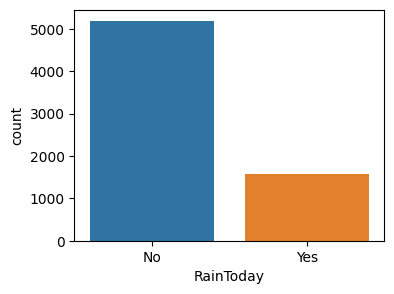

In [73]:
plt.figure(figsize=(4,3))
sns.countplot(x='RainToday', data=df)

df['RainToday'].value_counts()

- RainToday dataset comprises 6762 entries, with 23.2% rainy days (1572) and 76.8% non-rainy days (5190). 
- Analysis could explore seasonal patterns and correlations with variables like temperature or humidity.

RainTomorrow
No     5190
Yes    1572
Name: count, dtype: int64

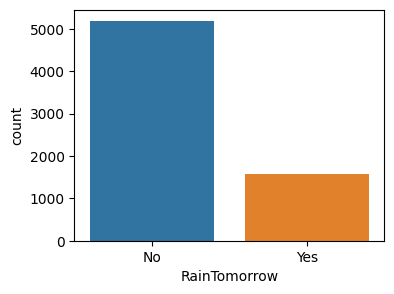

In [74]:
plt.figure(figsize=(4,3))
sns.countplot(x='RainTomorrow', data=df)

df['RainTomorrow'].value_counts()

- The RainTomorrow dataset consists of 6762 entries, with 23.2% indicating rain (1572) and 76.8% indicating no rain (5190). 
- Analysis may involve exploring factors influencing rain prediction.

Location
PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: count, dtype: int64

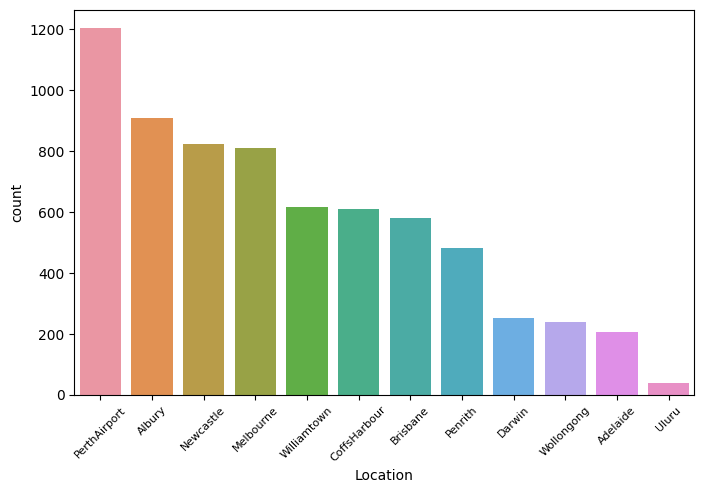

In [75]:
plt.figure(figsize=(8,5))
sns.countplot(x='Location', data=df, order = df['Location'].value_counts(). index)
plt.xticks(rotation=45, size=8)

df['Location'].value_counts()

- The "Location" dataset includes weather data from various locations, with PerthAirport having the highest entries (1204), followed by Albury (907) and Newcastle (822). 

WindGustDir
E      1460
SW      465
N       459
W       434
WSW     420
WNW     398
SSE     390
S       376
SE      370
ENE     357
NE      300
SSW     299
NW      296
NNE     287
ESE     267
NNW     184
Name: count, dtype: int64

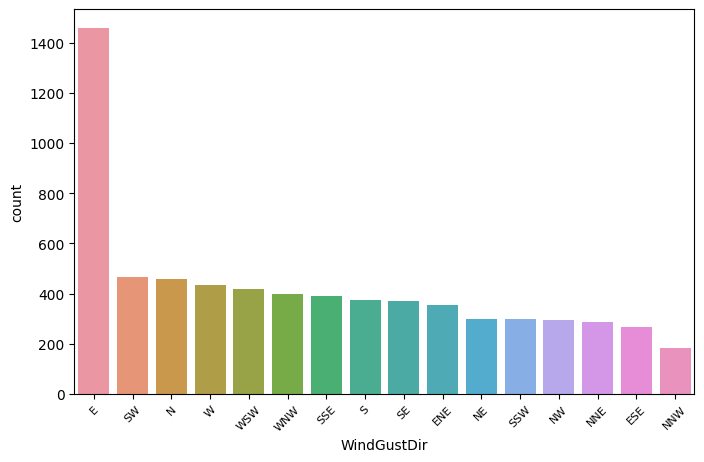

In [76]:
plt.figure(figsize=(8,5))
sns.countplot(x='WindGustDir', data=df, order = df['WindGustDir'].value_counts(). index)
plt.xticks(rotation=45, size=8)

df['WindGustDir'].value_counts()

- The "WindGustDir" data shows wind gust directions, with "E" occurring most frequently (1460 times), followed by "SW" (465) and "N" (459). Analyzing this data could provide insights into prevailing wind patterns

WindDir9am
N      1403
SW      590
NW      463
SE      439
ENE     397
WSW     394
SSW     368
NE      364
E       338
NNE     337
S       324
WNW     301
SSE     300
W       299
ESE     229
NNW     216
Name: count, dtype: int64

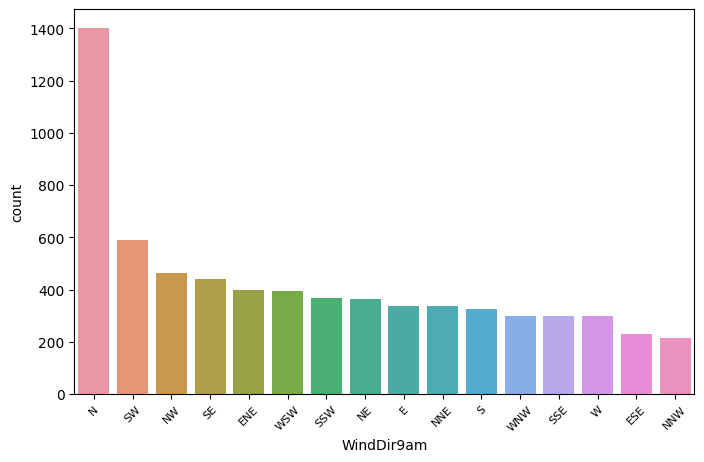

In [77]:
plt.figure(figsize=(8,5))
sns.countplot(x='WindDir9am', data=df, order = df['WindDir9am'].value_counts(). index)
plt.xticks(rotation=45, size=8)

df['WindDir9am'].value_counts()

- The "WindDir9am" dataset indicates wind directions at 9 am, with "N" being the most frequent (1403 occurrences), followed by "SW" (590) and "NW" (463). Analyzing this data provides insights into morning wind patterns.

WindDir3pm
SE     971
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: count, dtype: int64

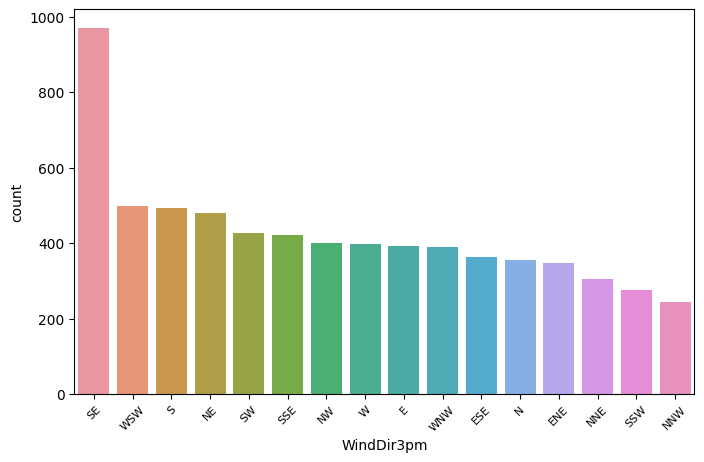

In [78]:
plt.figure(figsize=(8,5))
sns.countplot(x='WindDir3pm', data=df, order = df['WindDir3pm'].value_counts(). index)
plt.xticks(rotation=45, size=8)

df['WindDir3pm'].value_counts()

- The "WindDir3pm" data reveals wind directions at 3 pm, with "SE" being the most prevalent (971 occurrences), followed by "WSW" (499) and "S" (493).
- Analyzing this dataset aids in understanding afternoon wind patterns.

Cloud9am
5.0    2207
7.0    1043
1.0     922
8.0     764
0.0     521
6.0     454
3.0     313
2.0     311
4.0     227
Name: count, dtype: int64

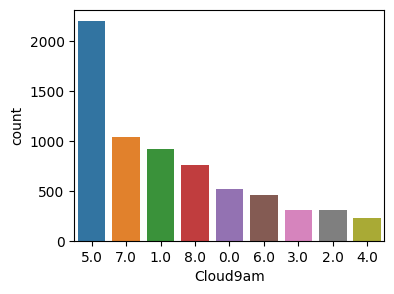

In [79]:
plt.figure(figsize=(4,3))
sns.countplot(x='Cloud9am', data=df, order = df['Cloud9am'].value_counts().index)

df['Cloud9am'].value_counts()

- The "Cloud9am" dataset indicates cloud cover at 9 am, with a significant occurrence of 5.0 (2207 instances), followed by 7.0 (1043) and 1.0 (922).
- Analyzing this data provides insights into morning cloud patterns

Cloud3pm
5.0    2335
7.0     959
1.0     921
8.0     644
6.0     489
2.0     428
3.0     357
0.0     332
4.0     297
Name: count, dtype: int64

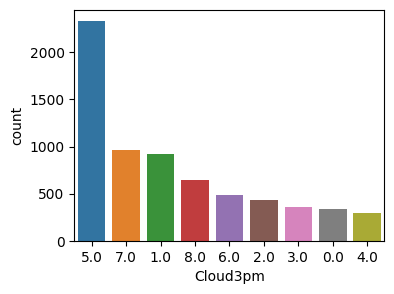

In [80]:
plt.figure(figsize=(4,3))
sns.countplot(x='Cloud3pm', data=df, order = df['Cloud3pm'].value_counts().index)

df['Cloud3pm'].value_counts()

- The "Cloud3pm" dataset reveals cloud cover at 3 pm, with a notable occurrence of 5.0 (2335 instances), followed by 7.0 (959) and 1.0 (921).
- Analyzing this data provides insights into afternoon cloud patterns. 

In [81]:
df['Year'] = df['Date'].dt.year

- creating Year column in the dataset

<Axes: xlabel='Year', ylabel='Density'>

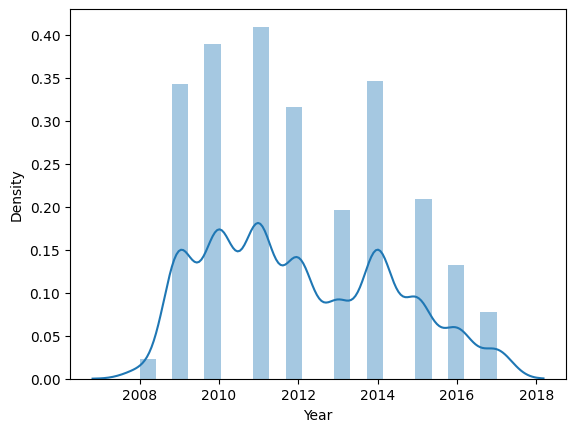

In [82]:
sns.distplot(df['Year'])

- A distplot would visually show the distribution of observations across these years. It appears that the distribution is right-skewed, with a higher concentration of observations in the later years, particularly peaking in 2014. There is also a noticeable trend towards 2010, indicating a substantial number of occurrences during that period.

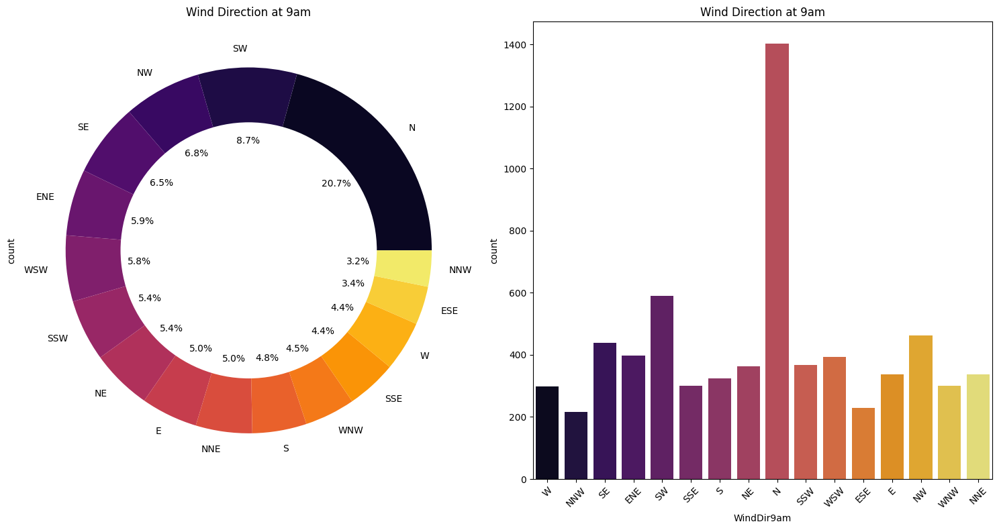

WindDir9am
N      1403
SW      590
NW      463
SE      439
ENE     397
WSW     394
SSW     368
NE      364
E       338
NNE     337
S       324
WNW     301
SSE     300
W       299
ESE     229
NNW     216
Name: count, dtype: int64

In [83]:
plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
df['WindDir9am'].value_counts().plot.pie(autopct='%1.1f%%', colors=sns.color_palette('inferno', len(df['WindDir9am'].unique())))
centre = plt.Circle((0, 0), 0.7, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre)
plt.title('Wind Direction at 9am')

plt.subplot(1, 2, 2)
sns.countplot(x='WindDir9am', data=df, palette='inferno')  
plt.title('Wind Direction at 9am')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

df['WindDir9am'].value_counts()

- The "WindDir9am" data shows the distribution of wind directions at 9 am. The most common direction is "N" with 1403 occurrences, followed by "SW" (590) and "NW" (463). This information is valuable for understanding morning wind patterns and can contribute to weather forecasting and analysis of daily climate variations.

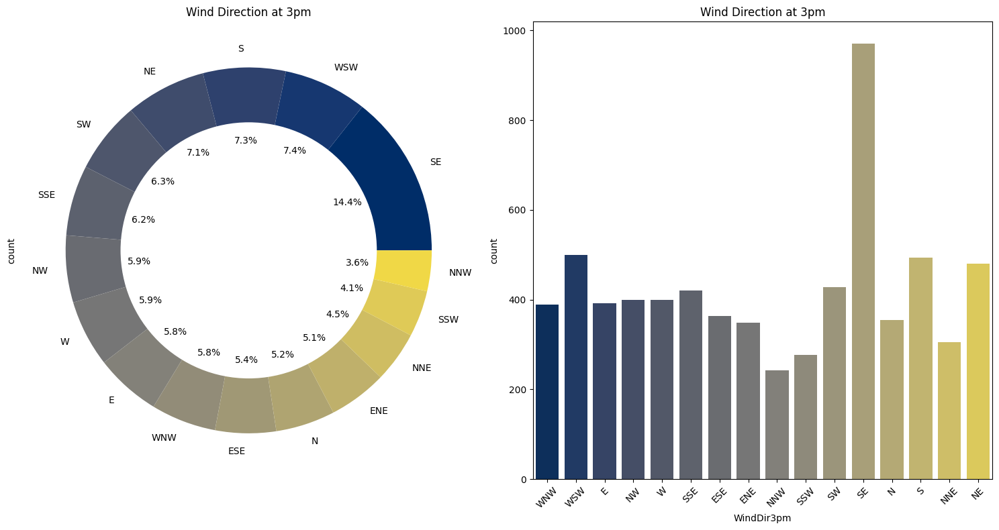

WindDir3pm
SE     971
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: count, dtype: int64

In [84]:
plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
df['WindDir3pm'].value_counts().plot.pie(autopct='%1.1f%%', colors=sns.color_palette('cividis', len(df['WindDir3pm'].unique())))
centre = plt.Circle((0, 0), 0.7, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre)
plt.title('Wind Direction at 3pm')

plt.subplot(1, 2, 2)
sns.countplot(x='WindDir3pm', data=df, palette='cividis')  
plt.title('Wind Direction at 3pm')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

df['WindDir3pm'].value_counts()

- The "WindDir3pm" data illustrates wind directions at 3 pm. The predominant direction is "SE" with 971 occurrences, followed by "WSW" (499) and "S" (493). Analyzing this dataset aids in understanding afternoon wind patterns, which is crucial for assessing daily weather changes and their potential impact on local weather conditions.

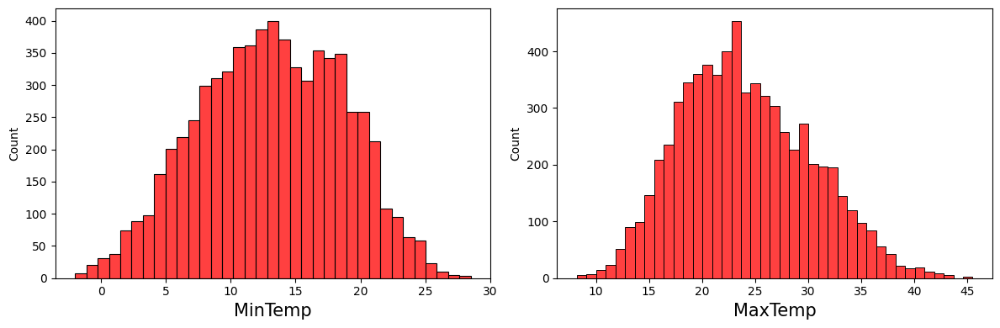

Target_variable Minimum of MaxTemp is 8.2 and Maximum of MaxTemp is 45.5
Target_variable Minimum of MinTemp is -2.0 and Maximum of MinTemp is 28.5


In [85]:
target_variables = ['MinTemp','MaxTemp'] 
plt.figure(figsize=(12,4),facecolor='white')
plotnumber=1

for col in target_variables:
    if plotnumber <=2:
        ax=plt.subplot(1,2,plotnumber)
        sns.histplot(df[col],color = 'r')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()
plt.show()

print('Target_variable Minimum of MaxTemp is {} and Maximum of MaxTemp is {}'.format(df['MaxTemp'].min(), df['MaxTemp'].max()))
print('Target_variable Minimum of MinTemp is {} and Maximum of MinTemp is {}'.format(df['MinTemp'].min(), df['MinTemp'].max()))

**MaxTemp Distribution:**

- Minimum value: 8.2
- Maximum value: 45.5
- The histogram plot for "MaxTemp" would display the frequency distribution of temperatures ranging from 8.2 to 45.5 degrees. Consider binning the data appropriately for a clear representation of temperature occurrences.

**MinTemp Distribution:**

- Minimum value: -2.0
- Maximum value: 28.5
- The histogram plot for "MinTemp" would illustrate the frequency distribution of temperatures ranging from -2.0 to 28.5 degrees. 

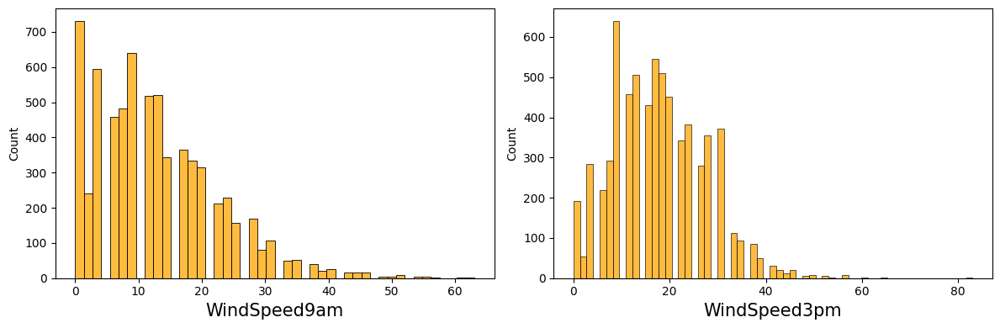

 Minimum WindSpeed at 9am: 0.0 and Maximum WindSpeed at 9am: 63.0
 Minimum WindSpeed at 3pm: 0.0 and Maximum WindSpeed at 3pm: 83.0


In [86]:
wind_speed = ['WindSpeed9am', 'WindSpeed3pm'] 
plt.figure(figsize=(12,4),facecolor='white')
plotnumber=1

for col in wind_speed:
    if plotnumber <=2:
        ax=plt.subplot(1,2,plotnumber)
        sns.histplot(df[col],color = 'orange')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()
plt.show()

print(' Minimum WindSpeed at 9am: {} and Maximum WindSpeed at 9am: {}'.format(df['WindSpeed9am'].min(),df['WindSpeed9am'].max()))
print(' Minimum WindSpeed at 3pm: {} and Maximum WindSpeed at 3pm: {}'.format(df['WindSpeed3pm'].min(),df['WindSpeed3pm'].max()))

These histogram plots can provide insights into the distribution of wind speeds at different times of the day probablity in the morning and afternoon

**WindSpeed at 9 am:**

- Minimum value: 0.0
- Maximum value: 63.0
- The histogram plot for WindSpeed at 9 am would illustrate the frequency distribution of wind speeds ranging from 0.0 to 63.0.

**WindSpeed at 3 pm:**

- Minimum value: 0.0
- Maximum value: 83.0
- The histogram plot for WindSpeed at 3 pm would showcase the frequency distribution of wind speeds ranging from 0.0 to 83.0. 

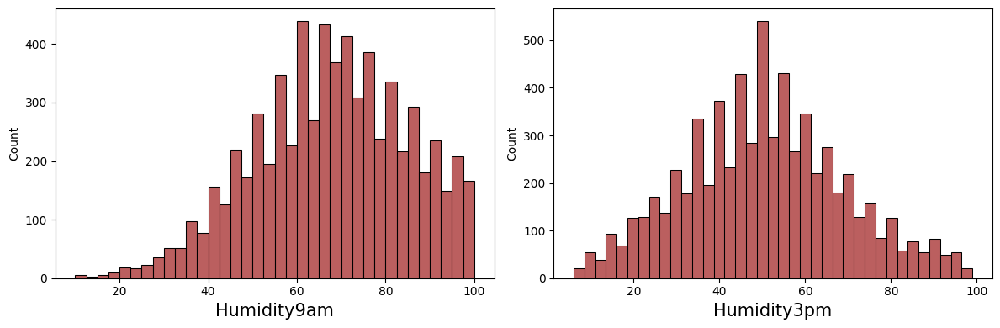

Minimum Humidity at 9am: 10.0 and Maximum Humidity at 9am: 100.0
Minimum Humidity at 3pm: 6.0 and Maximum Humidity at 3pm: 99.0


In [87]:
humidity = ['Humidity9am', 'Humidity3pm'] 
plt.figure(figsize=(12,4),facecolor='white')
plotnumber=1

for col in humidity:
    if plotnumber <=2:
        ax=plt.subplot(1,2,plotnumber)
        sns.histplot(df[col],color = 'brown')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()
plt.show()

print('Minimum Humidity at 9am: {} and Maximum Humidity at 9am: {}'.format(df['Humidity9am'].min(),df['Humidity9am'].max()))
print('Minimum Humidity at 3pm: {} and Maximum Humidity at 3pm: {}'.format(df['Humidity3pm'].min(),df['Humidity3pm'].max()))

 Histogram plots can offer insights into the distribution of humidity levels at different times of the day, aiding in understanding the variability and concentration of humidity patterns.
 
**Humidity at 9 am:**

- Minimum value: 10.0
- Maximum value: 100.0
- The histogram plot for Humidity at 9 am would depict the frequency distribution of humidity levels ranging from 10.0% to 100.0%. Suitable binning, identify common humidity ranges in the morning.

**Humidity at 3 pm:**

- Minimum value: 6.0
- Maximum value: 99.0
- The histogram plot for Humidity at 3 pm would showcase the frequency distribution of humidity levels ranging from 6.0% to 99.0%. 
- Appropriate binning has clear representation of the distribution of humidity levels in the afternoon.

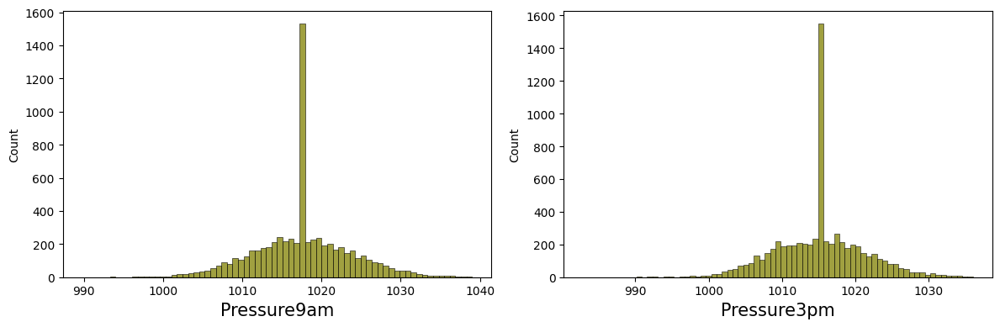

Minimum Pressure at 9am: 989.8 and Maximum Pressure at 9am: 1039.0
Minimum Pressure at 3pm: 982.9 and Maximum Pressure at 3pm: 1036.0


In [88]:
pressure = ['Pressure9am', 'Pressure3pm'] 
plt.figure(figsize=(12,4),facecolor='white')
plotnumber=1

for col in pressure:
    if plotnumber <=2:
        ax=plt.subplot(1,2,plotnumber)
        sns.histplot(df[col],color = 'olive')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()
plt.show()

print('Minimum Pressure at 9am: {} and Maximum Pressure at 9am: {}'.format(df['Pressure9am'].min(),df['Pressure9am'].max()))
print('Minimum Pressure at 3pm: {} and Maximum Pressure at 3pm: {}'.format(df['Pressure3pm'].min(),df['Pressure3pm'].max()))

Histogram, providing insights into atmospheric pressure patterns

**Pressure at 9 am:**

- Minimum: 989.8 hPa
- Maximum: 1039.0 hPa

**Pressure at 3 pm:**

- Minimum: 982.9 hPa
- Maximum: 1036.0 hPa
 








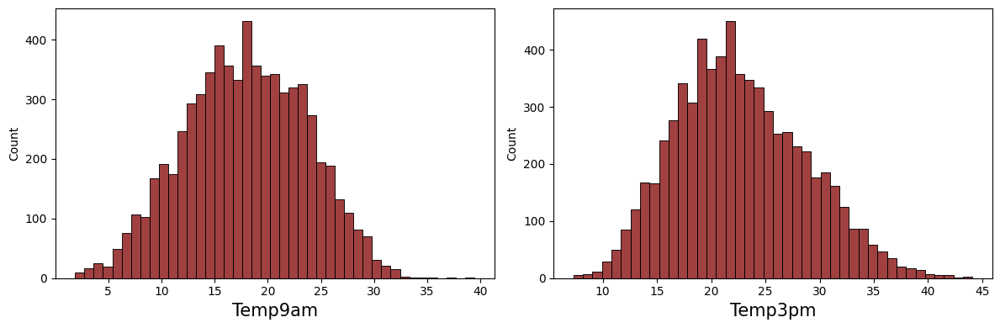

Minimum Temp at 9am: 1.9 and Maximum Temp at 9am: 39.4
Minimum Temp at 3pm: 7.3 and Maximum Temp at 3pm: 44.1


In [89]:
temperature = ['Temp9am', 'Temp3pm'] 
plt.figure(figsize=(12,4),facecolor='white')
plotnumber=1

for col in temperature:
    if plotnumber <=2:
        ax=plt.subplot(1,2,plotnumber)
        sns.histplot(df[col],color = 'maroon')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()
plt.show()

print('Minimum Temp at 9am: {} and Maximum Temp at 9am: {}'.format(df['Temp9am'].min(),df['Temp9am'].max()))
print('Minimum Temp at 3pm: {} and Maximum Temp at 3pm: {}'.format(df['Temp3pm'].min(),df['Temp3pm'].max()))

Histogram plots, could visualize the distribution of temperature levels at these times, providing insights into temperature patterns throughout the day.

**Temperature at 9 am:**

- Minimum: 1.9°C
- Maximum: 39.4°C

**Temperature at 3 pm:**

- Minimum: 7.3°C
- Maximum: 44.1°C

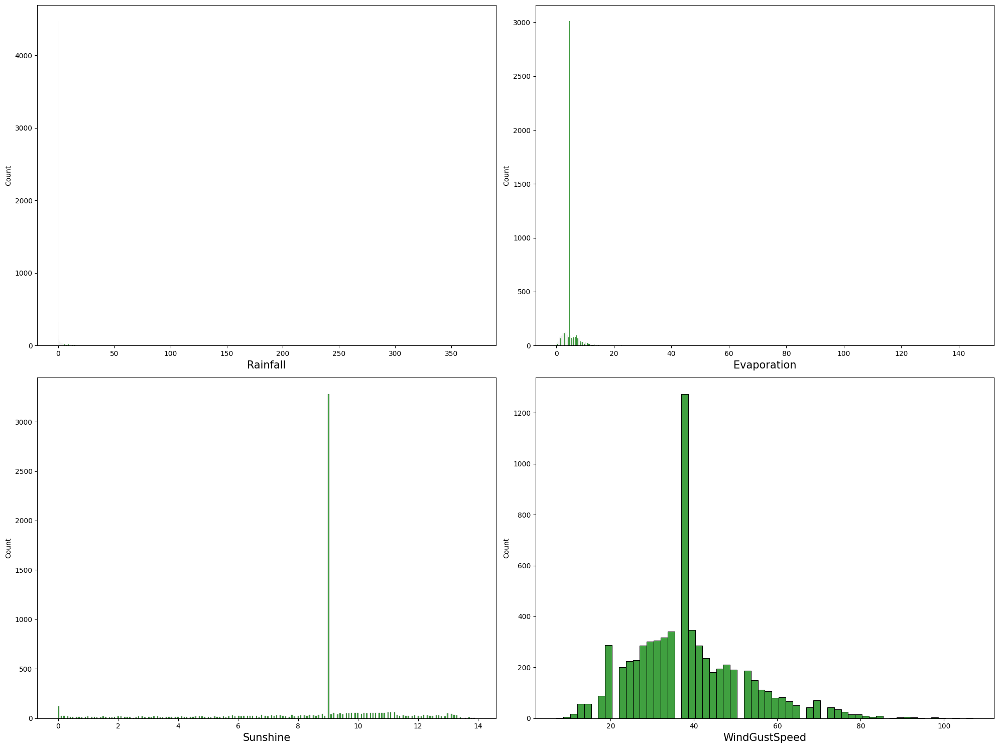

In [90]:
variables= ['Rainfall','Evaporation', 'Sunshine', 'WindGustSpeed'] 
plt.figure(figsize=(20,15),facecolor='white')
plotnumber=1

for col in variables:
    if plotnumber <=4:
        ax=plt.subplot(2,2,plotnumber)
        sns.histplot(df[col],color = 'g')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()
plt.show()

- The Rainfall variable lacks a discernible pattern, making it challenging to draw meaningful conclusions compared to other factors.

- Evaporation predominantly occurs in the range of 0 to 10, suggesting a concentration of lower evaporation values.

- Sunshine exhibits a generally erratic pattern, but a notable increase is observed around 9, hinting at a potential linear relationship at that point.

- WindGustSpeed displays an upward trend from 20, peaks around 38, and then gradually decreases, indicating a rise and fall pattern in wind gust speeds.

### Bivariate Analysis

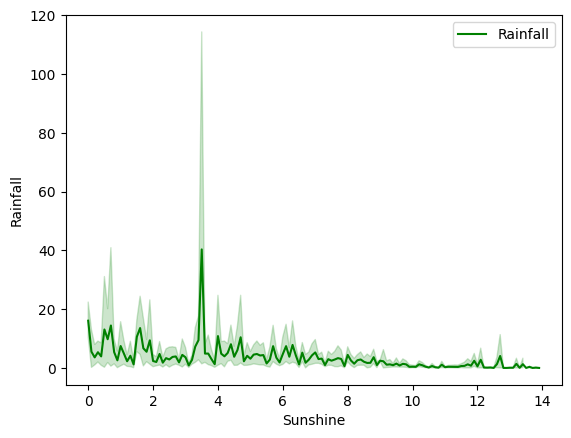

In [91]:
sns.lineplot(data=df, x='Sunshine', y='Rainfall', color='green', label='Rainfall')
plt.legend()
plt.show()

- The lineplot is irregular which reveal specific strong relationships between sunshine and rainfall.
- At 3.5 Sunshine values where Rainfall reaches its highest which can be the be informative for rain forecasting.
- There is a positive correlation (rainfall increases with sunshine), from 10 onwarda there is no correlationship

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


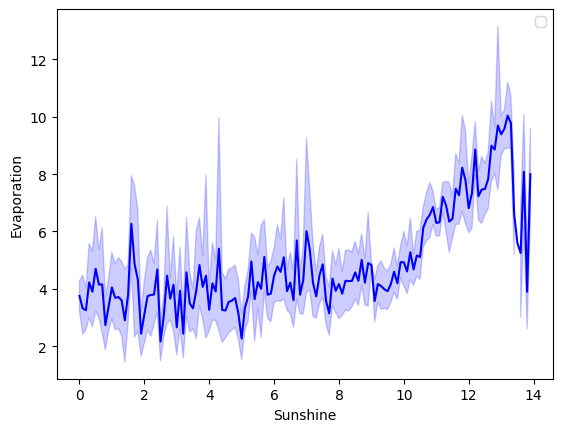

In [92]:
sns.lineplot(data=df,x='Sunshine',y='Evaporation',color='blue')
plt.legend()
plt.show()

- The lineplot is irregular which reveal specific strong relationships between sunshine and rainfall.
- At 13.5 Sunshine values where Evaporation reaches its highest and at 1.8 and 2.3 sunshine values where Evaporation reaches its lowest which can be the be informative for rain forecasting.
- there is a positive correlation and negative correlationship(rainfall increases with sunshine)

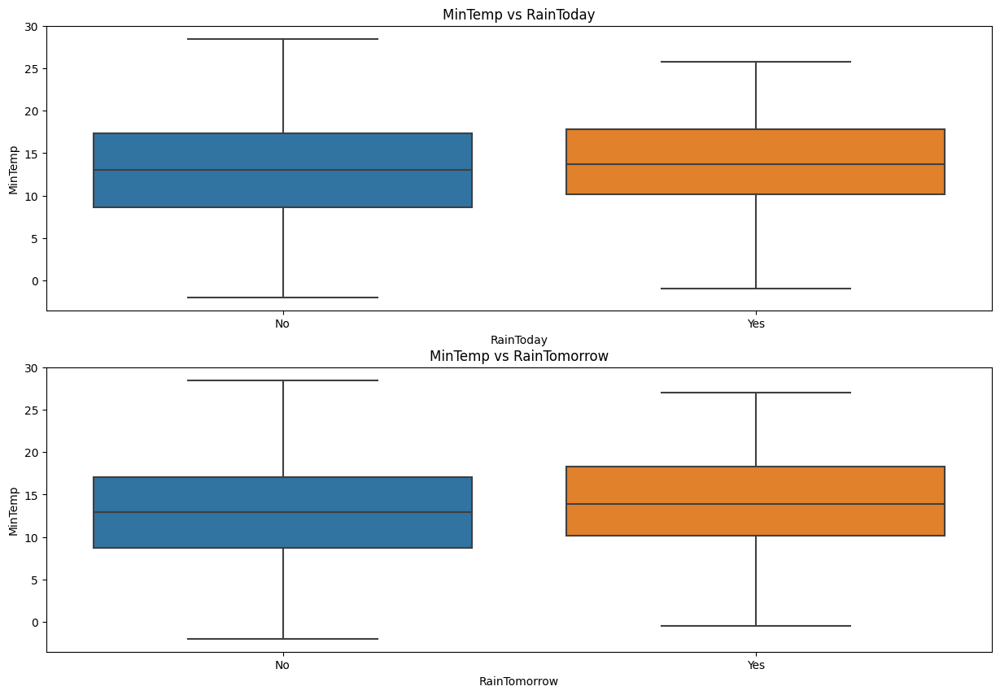

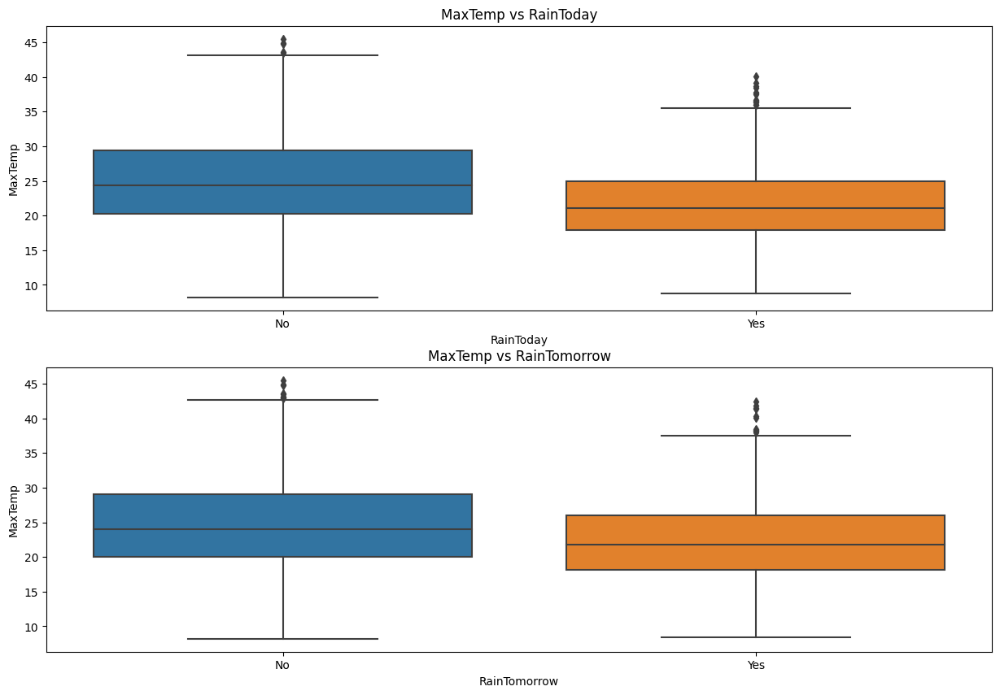

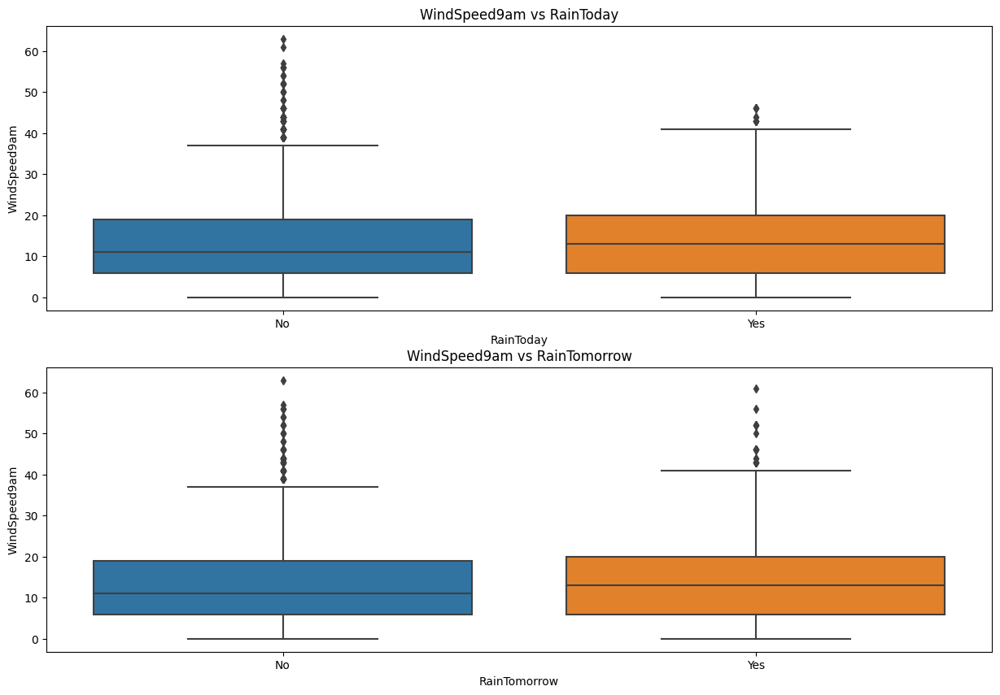

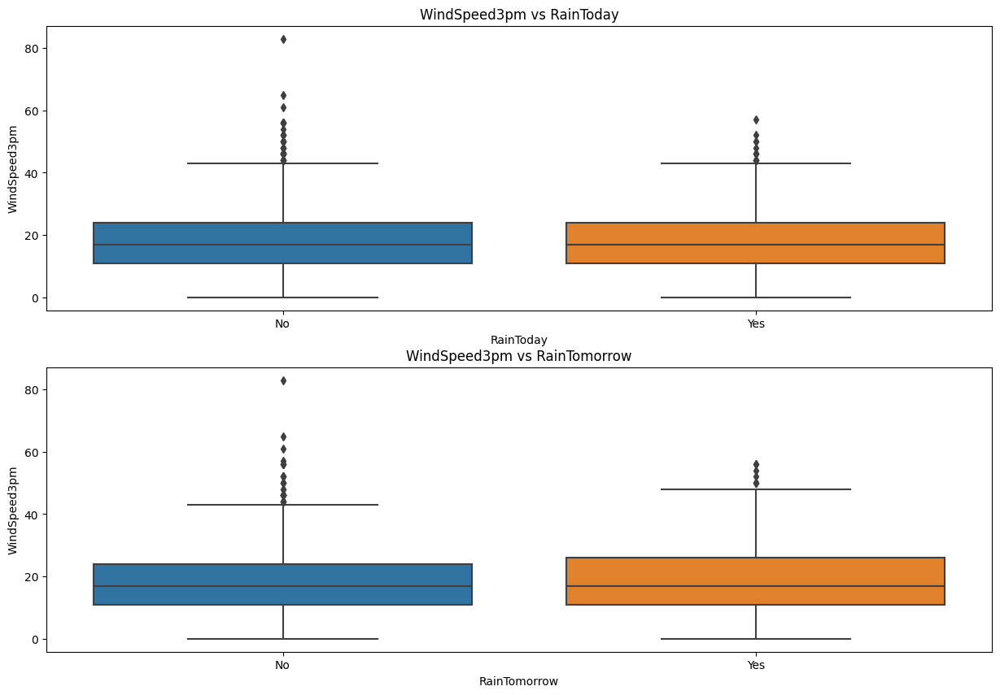

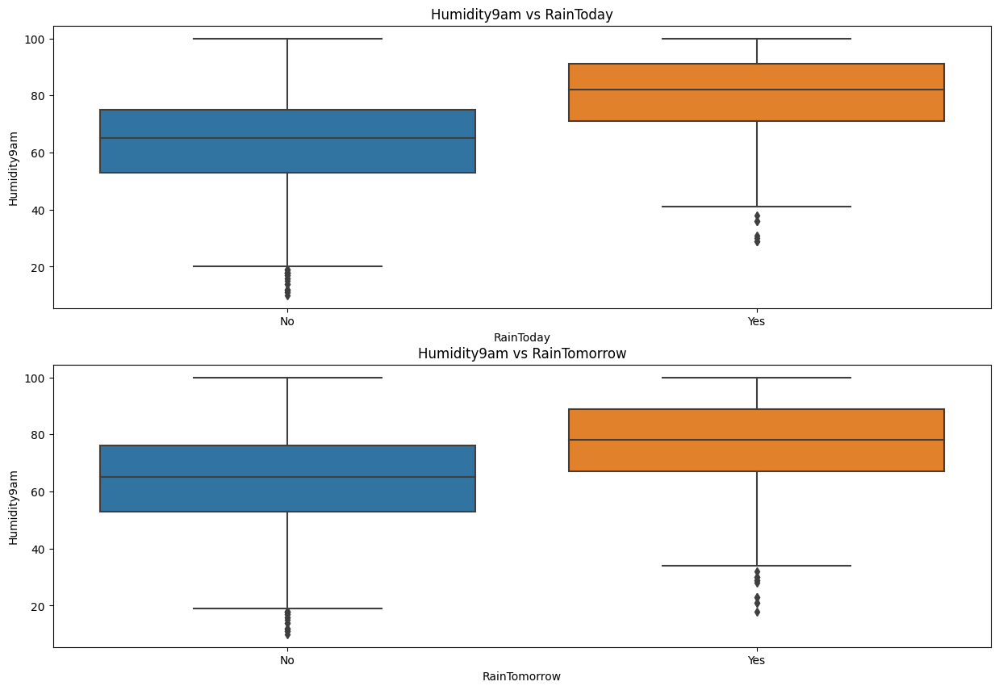

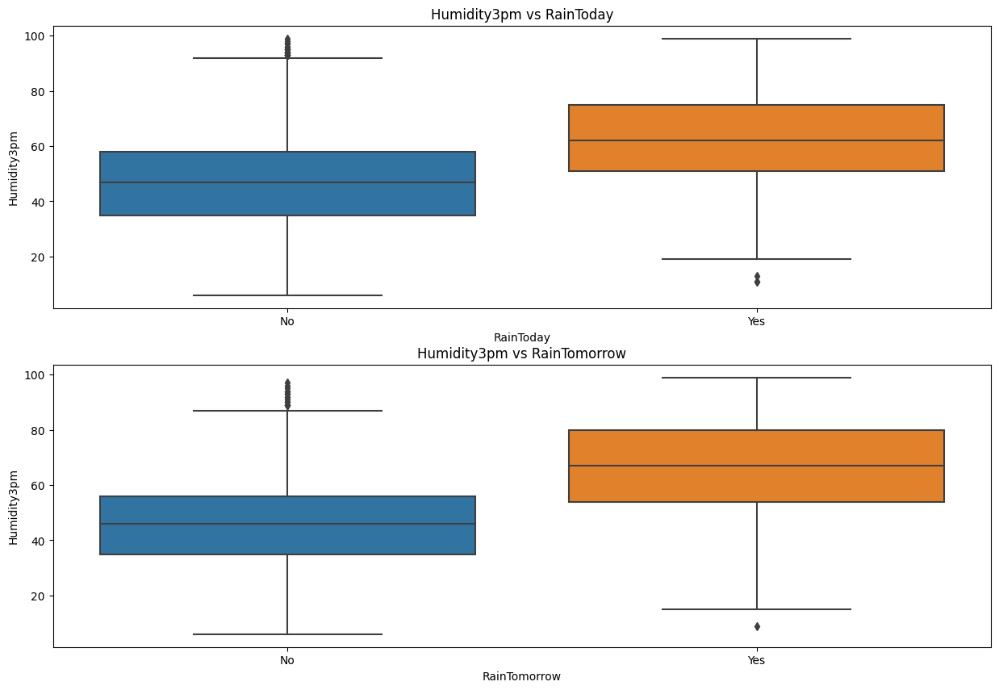

In [93]:
variables = ['MinTemp', 'MaxTemp','WindSpeed9am','WindSpeed3pm','Humidity9am', 'Humidity3pm']
target_variables = ['RainToday','RainTomorrow']

for var in variables:
    plt.figure(figsize=(15,10))
    for target_var in target_variables:
        plt.subplot(2, 1, target_variables.index(target_var) + 1)
        sns.boxplot(x=target_var, y=var, data=df)
        plt.xticks(rotation=0)
        plt.title(f'{var} vs {target_var}')
    plt.show()

- MinTemp Vs RainToday Vs RainTomorrow has no special trend has been observed
- MaxTemp Vs RainToday Vs RainTomorrow has no special trend has been observed
- WindSpeed9am Vs RainToday Vs RainTomorrow shows data has not been dispersed much and no much trend been observed
- WindSpeed3pm Vs RainToday Vs RainTomorrow shows data has not been dispersed much and no much trend been observed
- Humidity9am Vs RainToday Vs RainTomorrow shows data has been dispersed much, rains (Yes) the associated values are generally higher than when it does not rain (No)
- Humidity3pm Vs RainToday Vs RainTomorrow shows data has been dispersed much, rains (Yes) the associated values are generally higher than when it does not rain (No)

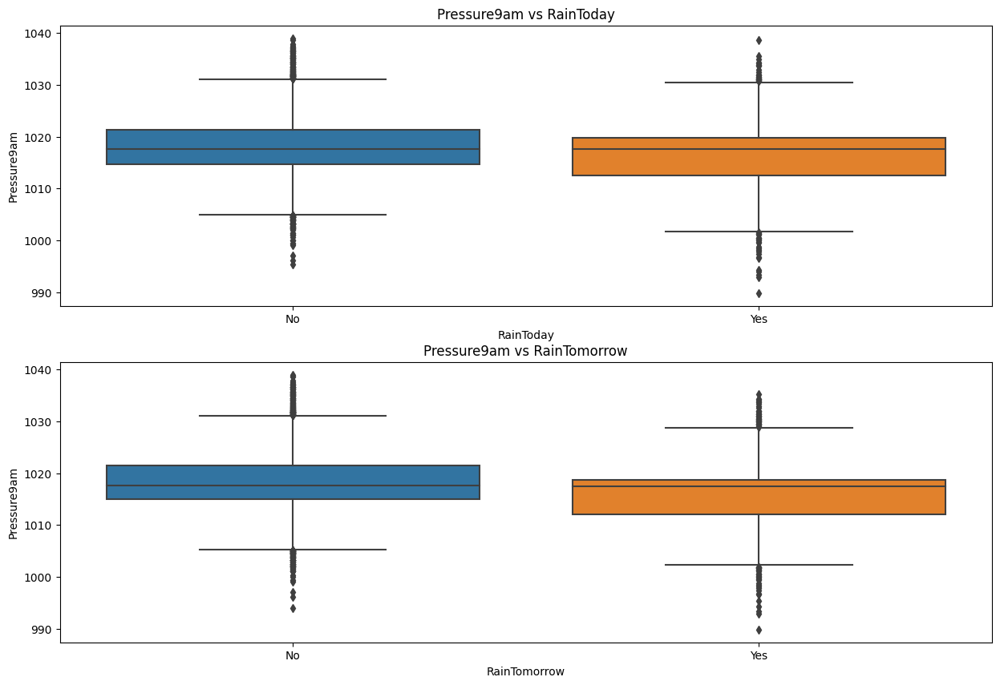

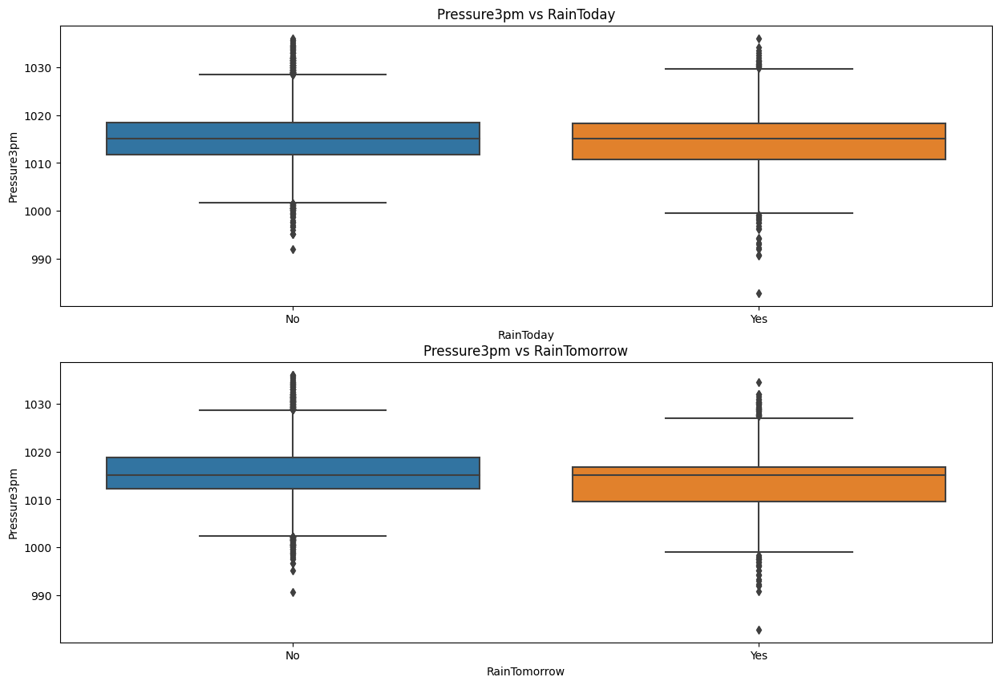

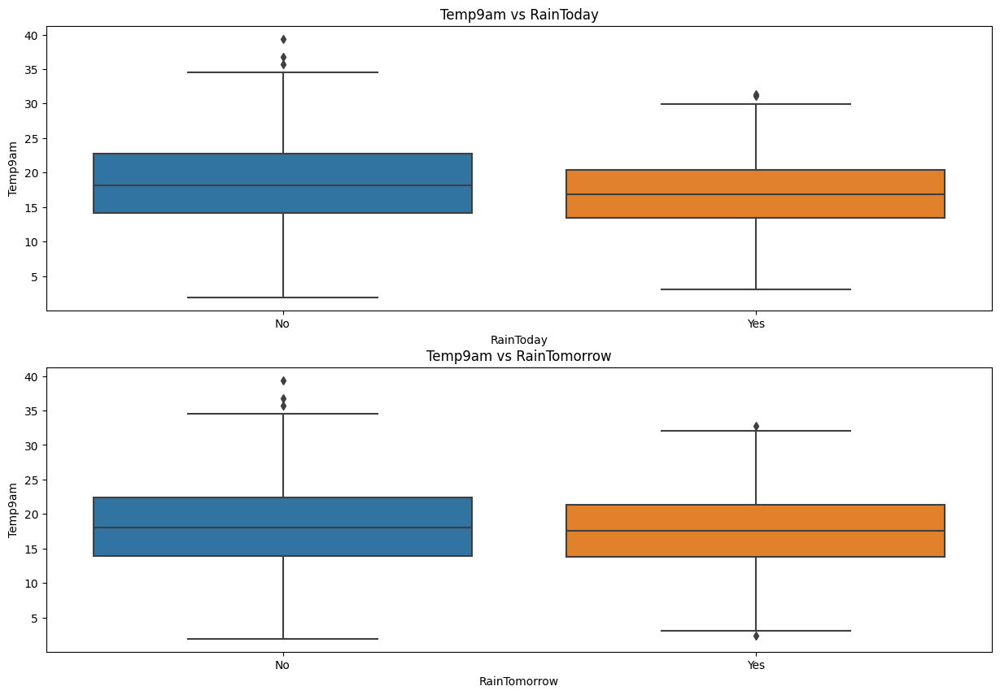

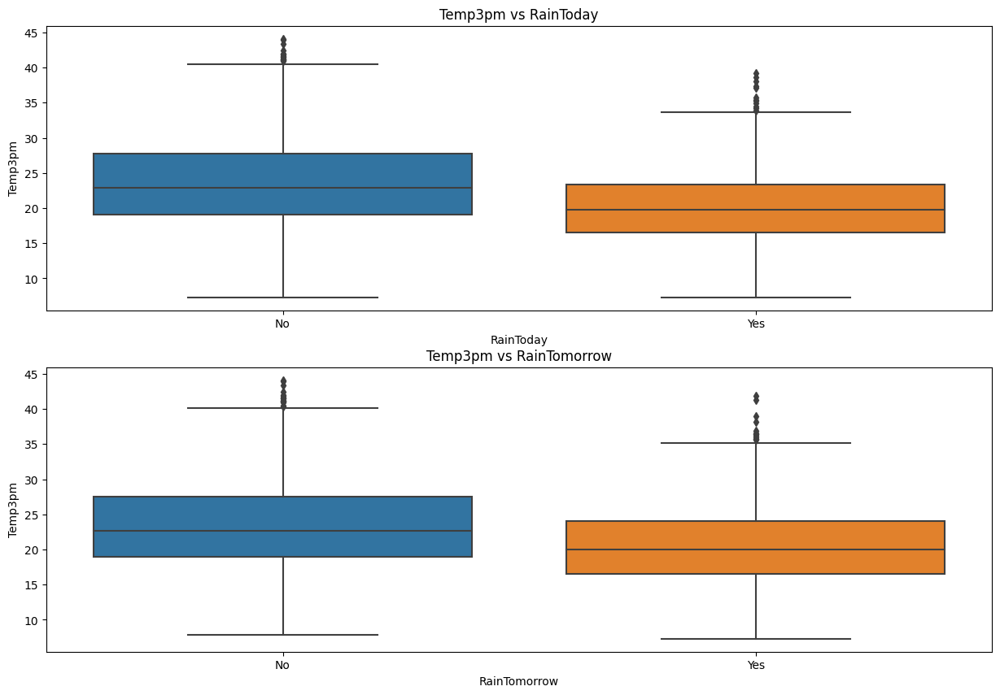

In [94]:
variables = ['Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
target_variables = ['RainToday','RainTomorrow']

for var in variables:
    plt.figure(figsize=(15,10))
    for target_var in target_variables:
        plt.subplot(2, 1, target_variables.index(target_var) + 1)
        sns.boxplot(x=target_var, y=var, data=df)
        plt.xticks(rotation=0)
        plt.title(f'{var} vs {target_var}')
    plt.show()

- Pressure9am Vs RainToday Vs RainTomorrow shows data has been dispersed much, rains (Yes) and rain (No) has no much different pattern
- Pressure3pm Vs RainToday Vs RainTomorrow shows data has been dispersed much, rains (Yes) and rain (No) has no much different pattern
- Temp3am Vs RainToday Vs RainTomorrow shows data has been dispersed much, rains (Yes) and rain (No) has no much different pattern
- Temp3pm Vs RainToday Vs RainTomorrow shows data has been dispersed much, rains (Yes) and rain (No) has no much different pattern, they aall associated with few outliers

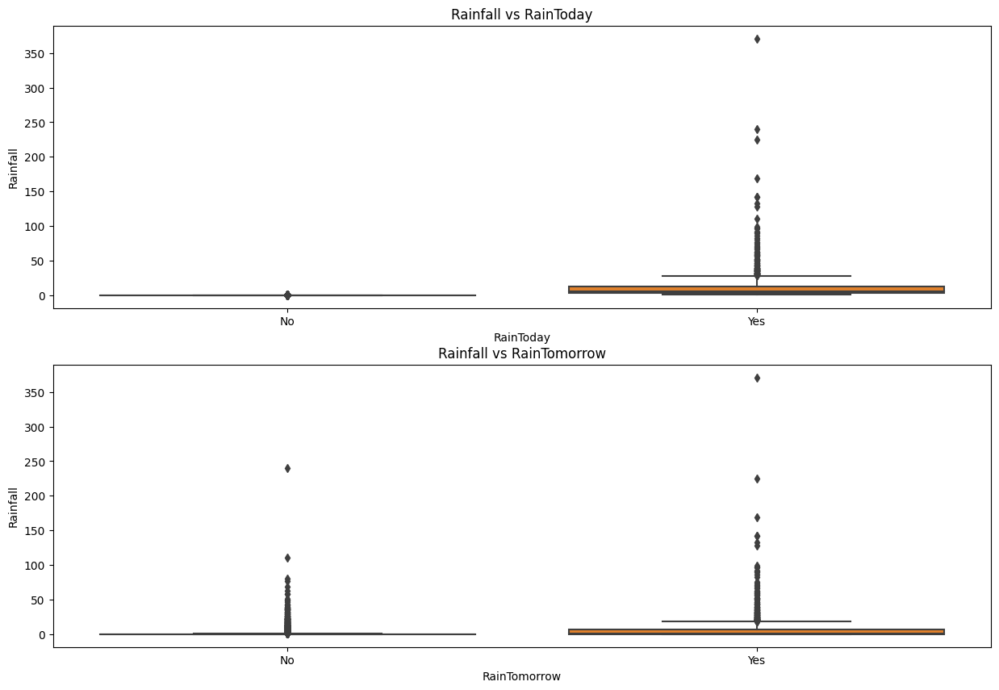

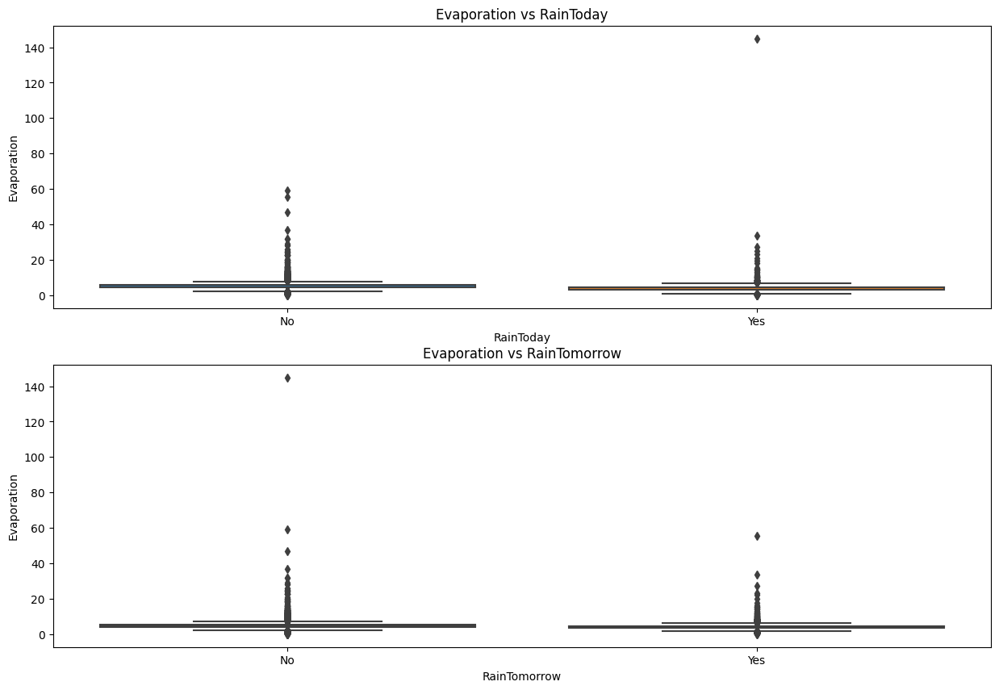

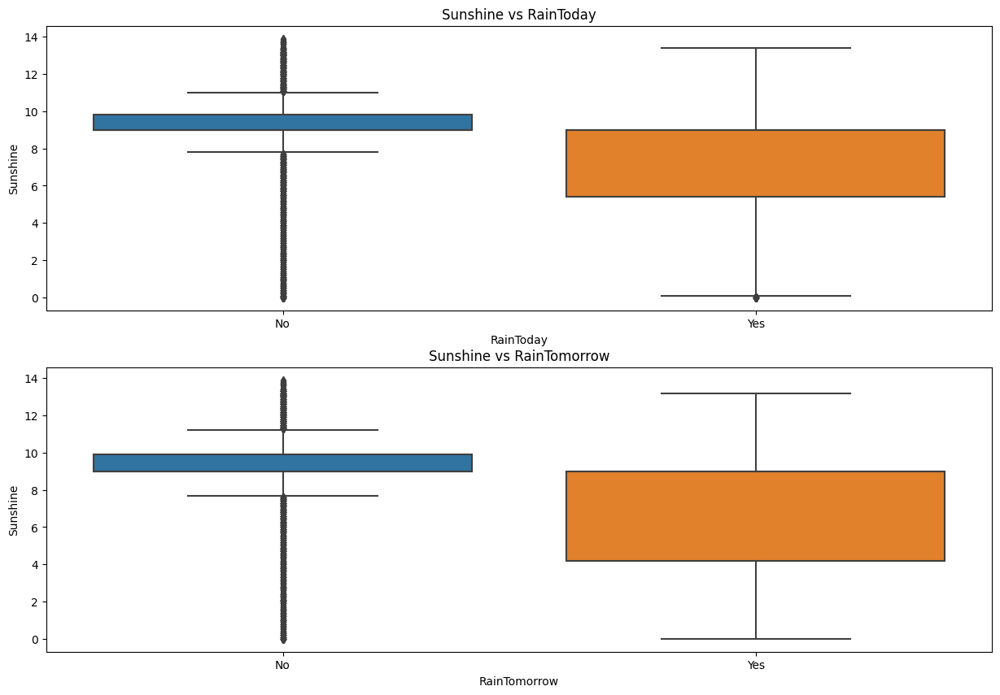

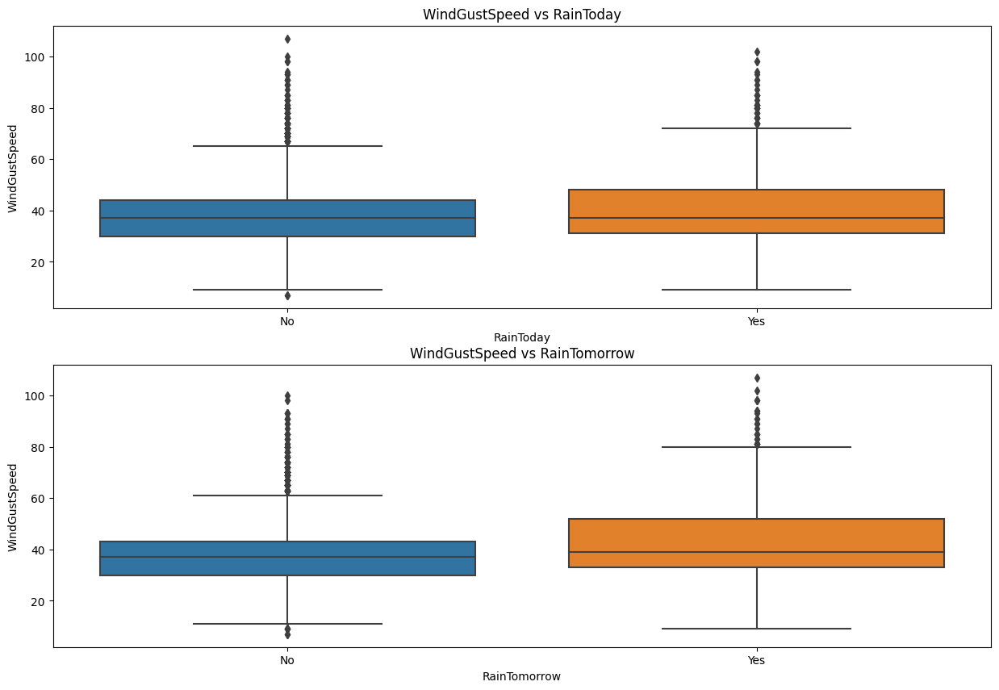

In [95]:
variables = ['Rainfall','Evaporation', 'Sunshine','WindGustSpeed']
target_variables = ['RainToday','RainTomorrow']

for var in variables:
    plt.figure(figsize=(15,10))
    for target_var in target_variables:
        plt.subplot(2, 1, target_variables.index(target_var) + 1)
        sns.boxplot(x=target_var, y=var, data=df)
        plt.xticks(rotation=0)
        plt.title(f'{var} vs {target_var}')
    plt.show()

- Rainfall Vs RainToday Vs RainTomorrow shows data has no much dispersion, rains (Yes) and rain (No) has not shown any change in pattern
- Evaporation Vs RainToday Vs RainTomorrow shows data has no much dispersion, rains (Yes) and rain (No) has not shown any change in pattern
- Sunshine Vs RainToday Vs RainTomorrow majority of the data in that range is tightly concentrated, and there may be less variability and many outliers for rain(No)
- WindGutSpeed Vs RainToday Vs RainTomorrow majority of the data in that range is tightly concentrated, and there may be less variability and many outliers for rain(No)

### Multivariate Analysis

MinTemp


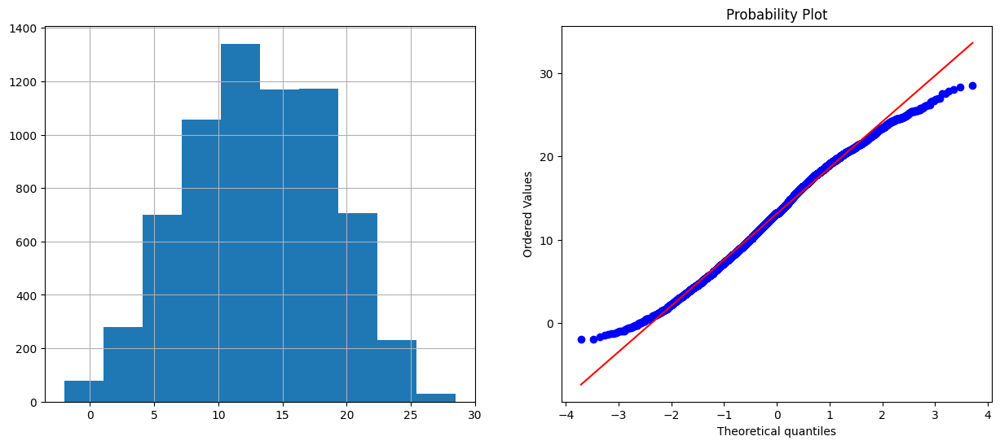

MaxTemp


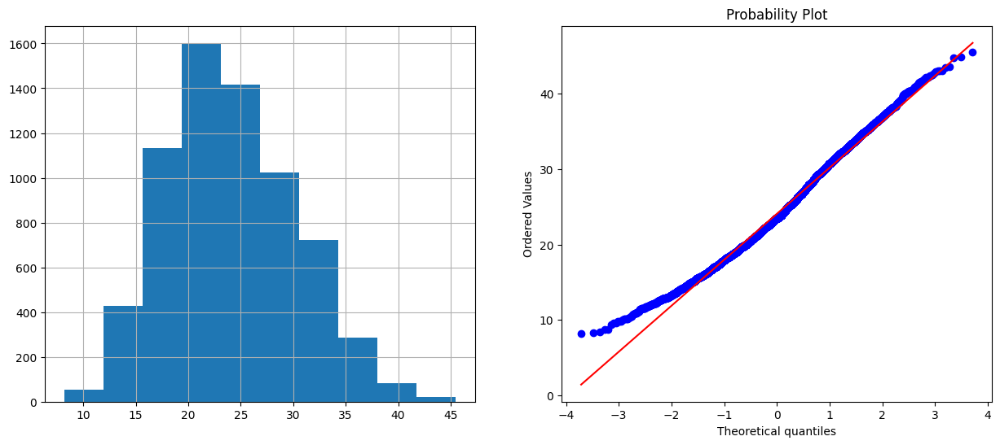

Rainfall


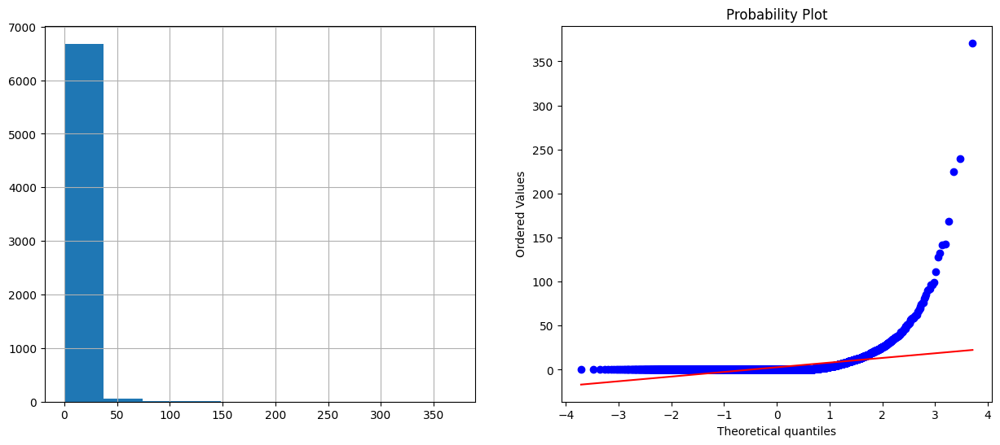

WindSpeed9am


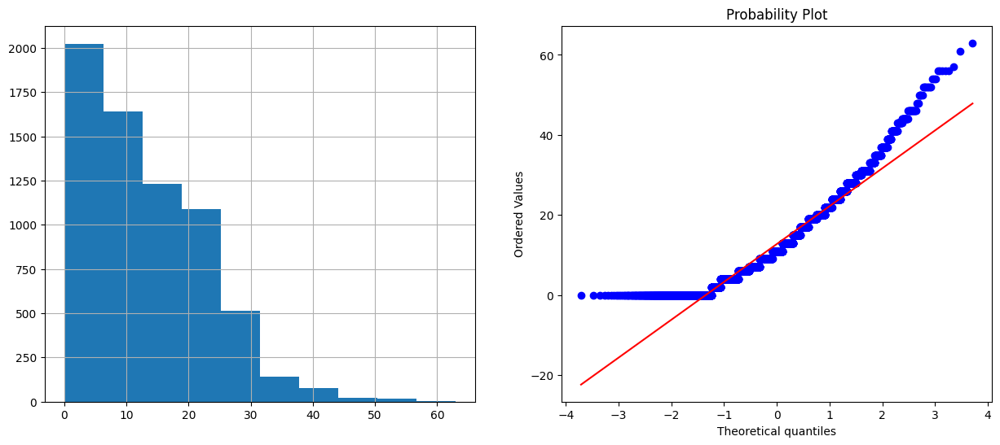

WindSpeed3pm


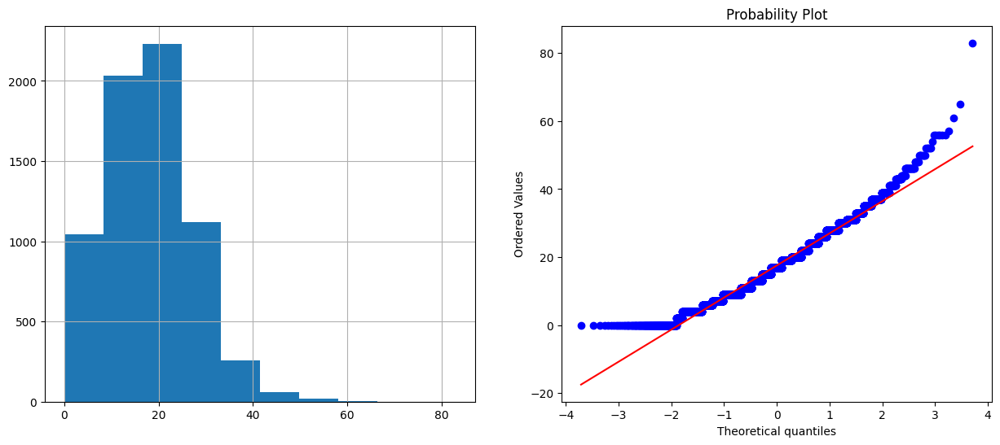

Evaporation


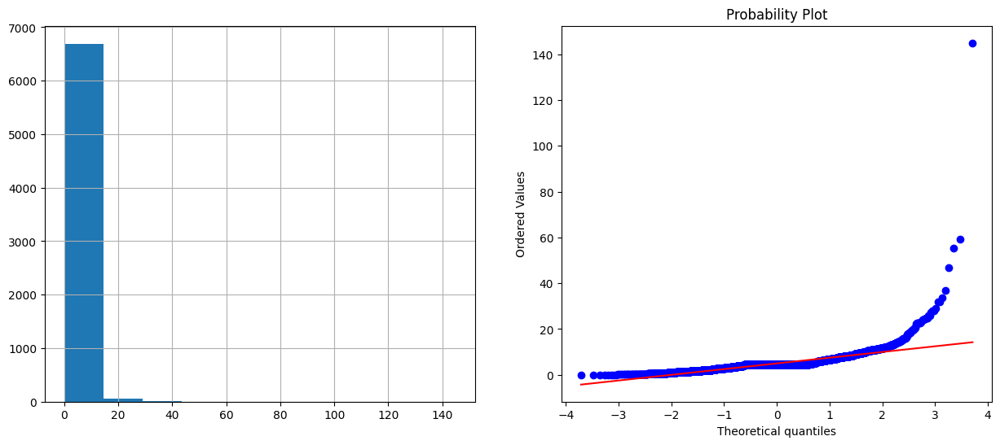

Sunshine


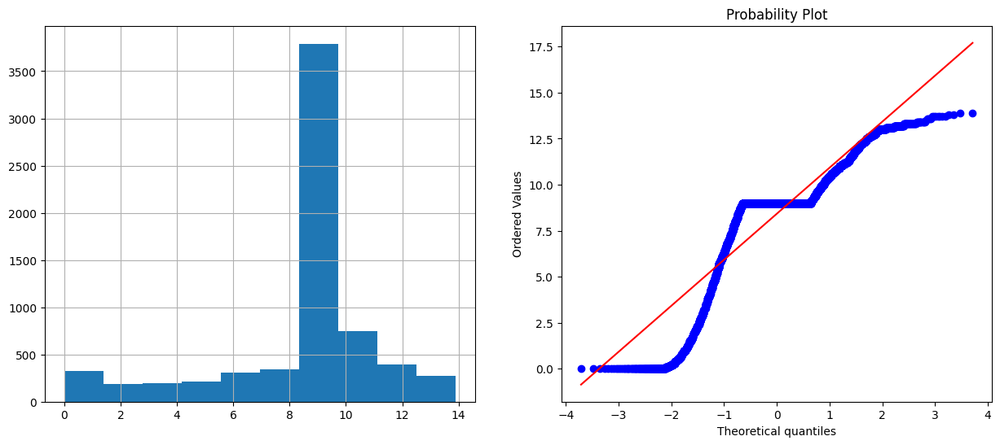

WindGustSpeed


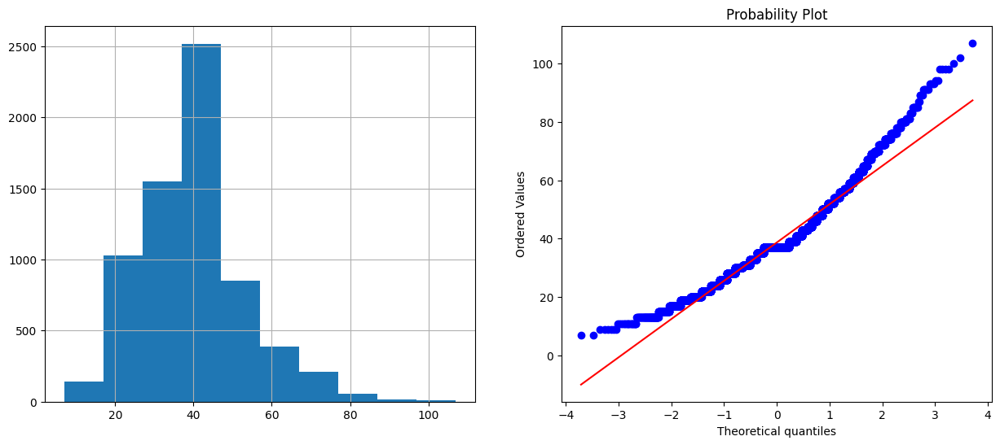

Humidity9am


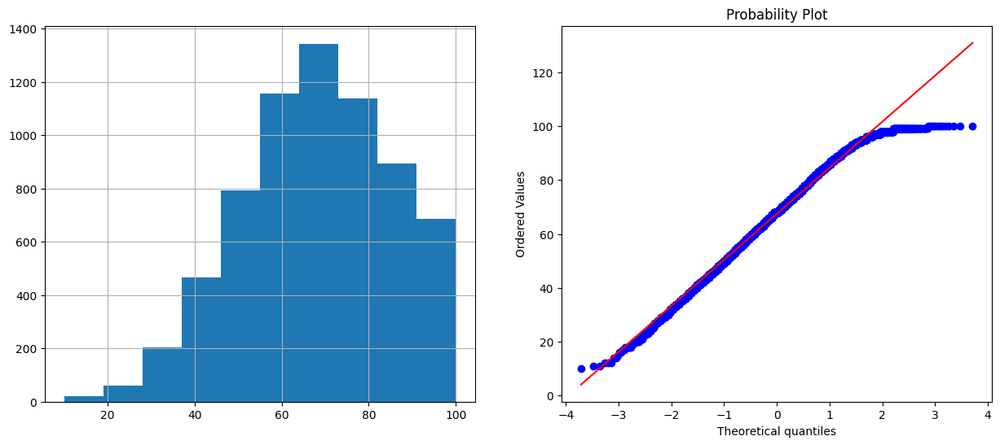

Humidity3pm


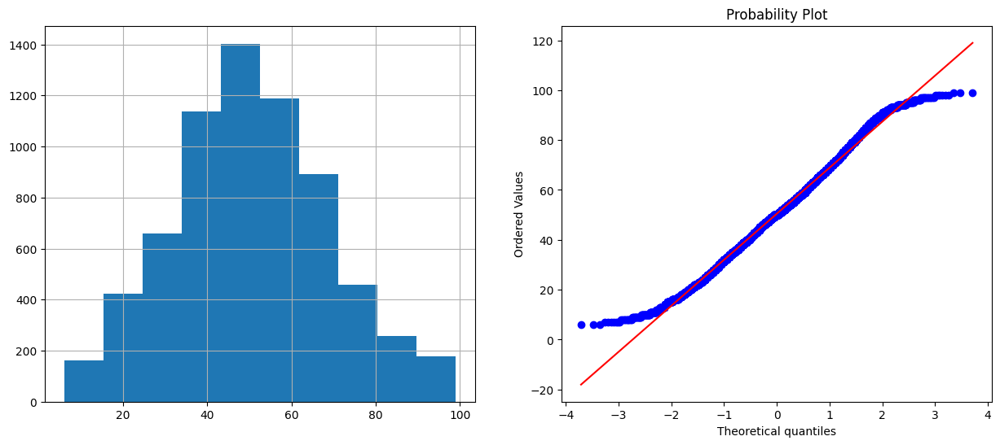

Pressure9am


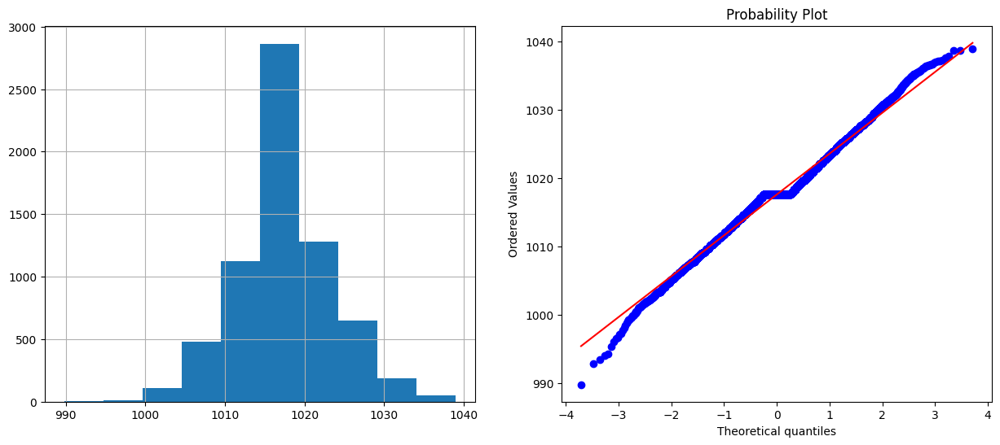

Pressure3pm


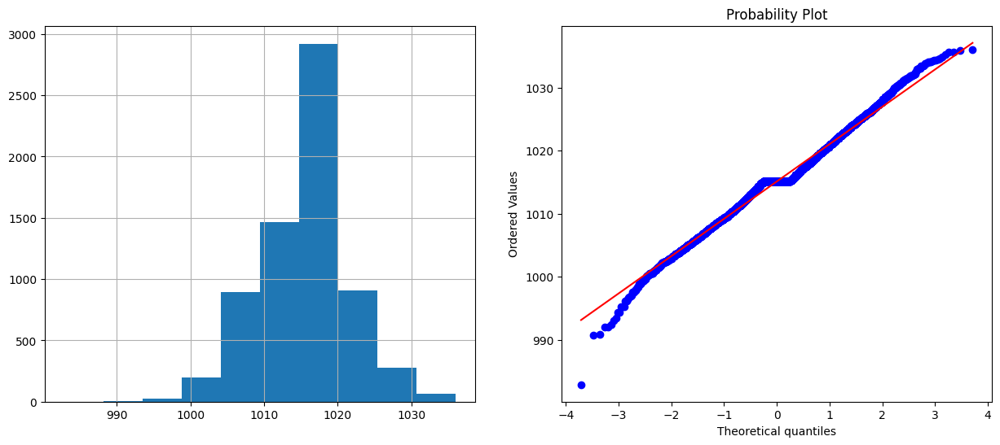

Temp9am


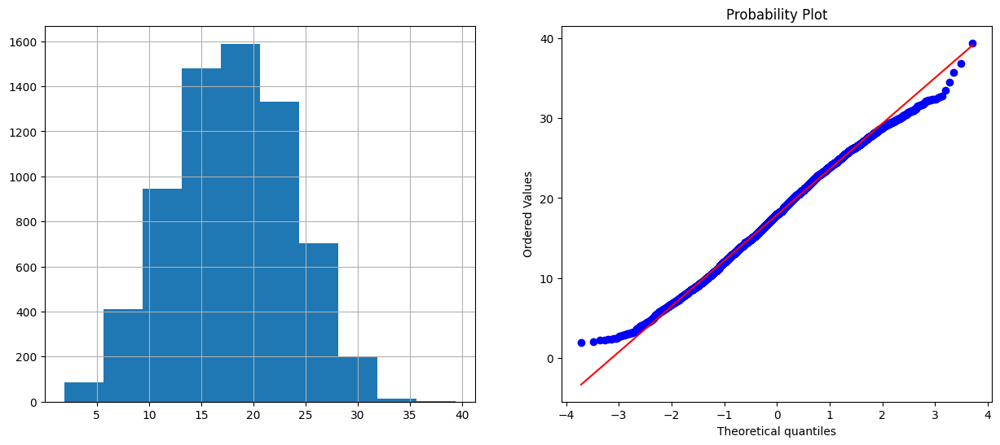

Temp3pm


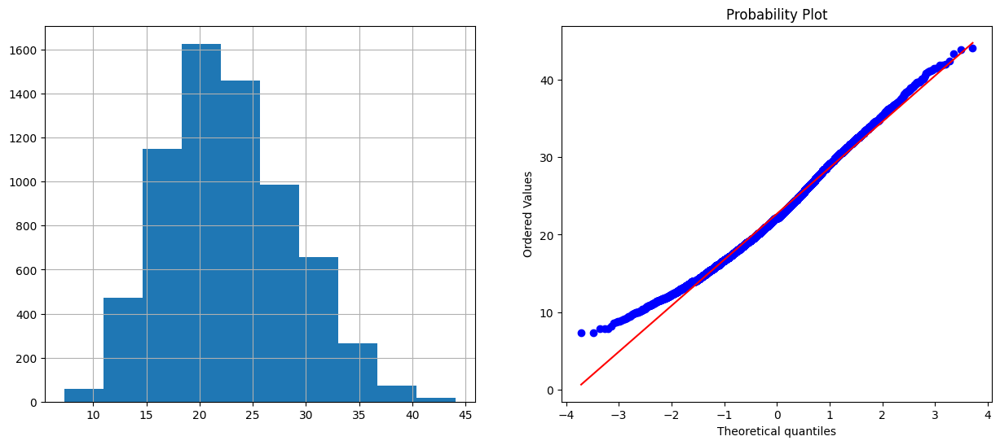

In [96]:
numerical_columns = ['MinTemp', 'MaxTemp', 'Rainfall','WindSpeed9am','WindSpeed3pm', 'Evaporation',
           'Sunshine', 'WindGustSpeed','Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',
           'Temp9am', 'Temp3pm']

import scipy.stats as stats

def qq_plots(df, variable):
    plt.figure(figsize=(15, 6))
    plt.subplot(1, 2, 1)
    df[variable].hist()
    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist='norm', plot=plt)
    plt.show()


for feature in numerical_columns:
    print(feature)
    plt.figure(figsize=(15, 6))
    plt.subplot(1, 2, 1)
    df[feature].hist()
    plt.subplot(1, 2, 2)
    stats.probplot(df[feature], dist='norm', plot=plt)
    plt.show()


Min and Max Temperature, Rainfall, WindSpeed9am, WindSpeed3pm, Evaporation, WindGustSpeed,Humidity9am, Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
- The qq-plot on the left shows that the ordered distribution of residuals (blue dots) follows the linear trend of the samples taken from a standard normal distribution with N(0, 1). This is a strong indication that the residuals are normally distributed.

Sunshine, Rainfall
- The data is concentrated in the 0-40 range with fewer or no observations beyond 40 for Rainfall and for 9 for sunshine . The QQ plot suggests that, overall, the data is skewed, but there might be a slight deviation, particularly in the tail, around the value of 2 and 1 for Sunshine

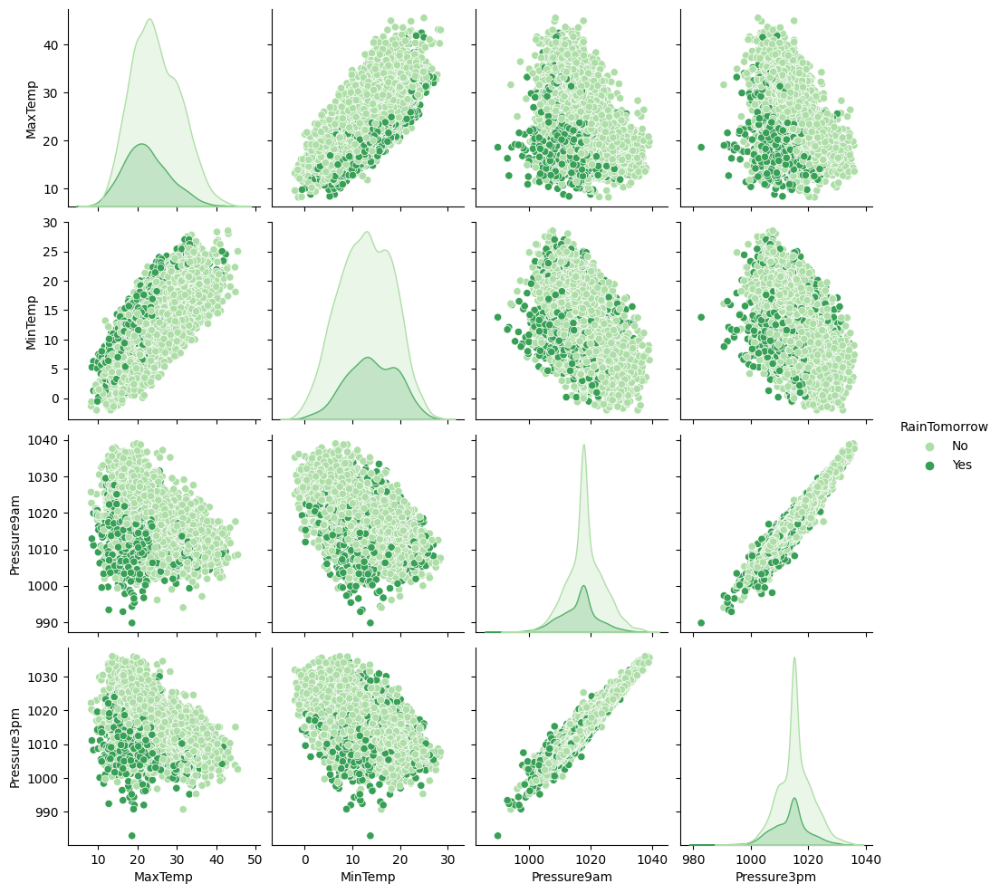

In [97]:
sns.pairplot( data=df, vars=('MaxTemp','MinTemp','Pressure9am','Pressure3pm'), hue='RainTomorrow' ,palette = 'Greens')
plt.show()

The following pairs of features are having high correlation between them:

- MaxTemp and MinTemp
- Pressure9am and Pressure3pm

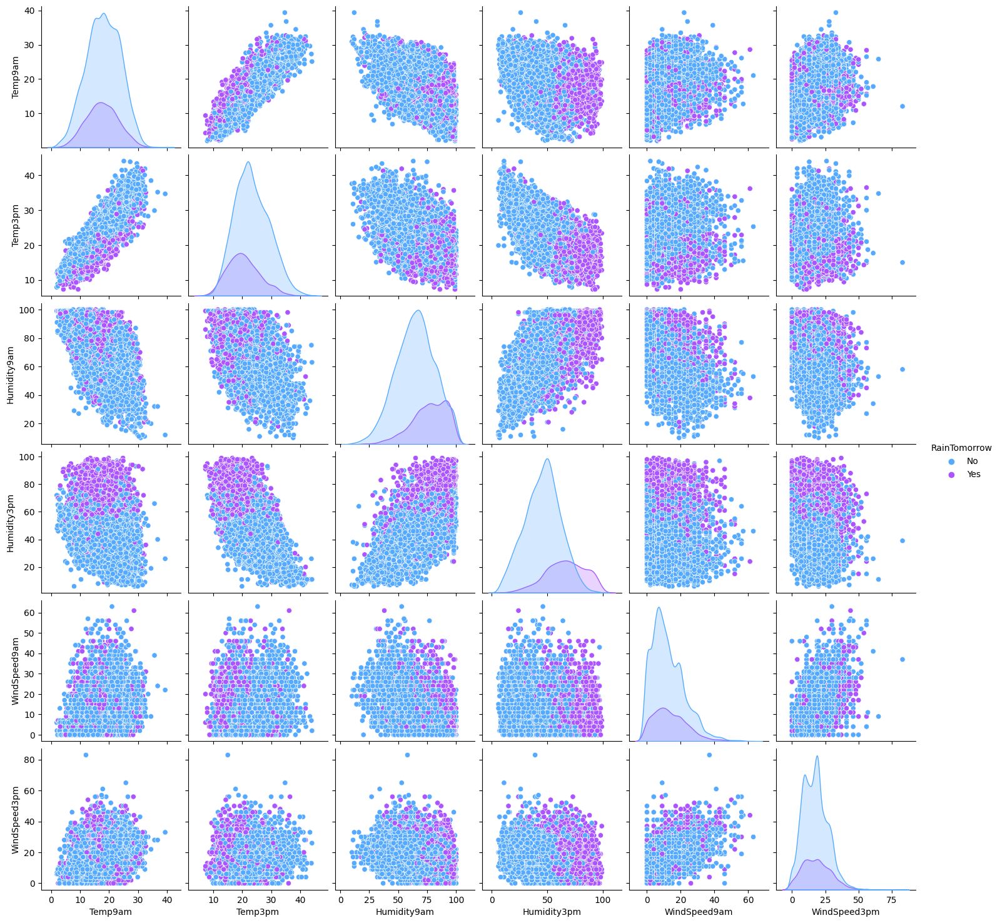

In [98]:
sns.pairplot( data=df, vars=('Temp9am', 'Temp3pm', 'Humidity9am', 'Humidity3pm','WindSpeed9am','WindSpeed3pm'), hue='RainTomorrow',palette = 'cool'  )
plt.show()

- Temperature and Humidity has strong correlationship

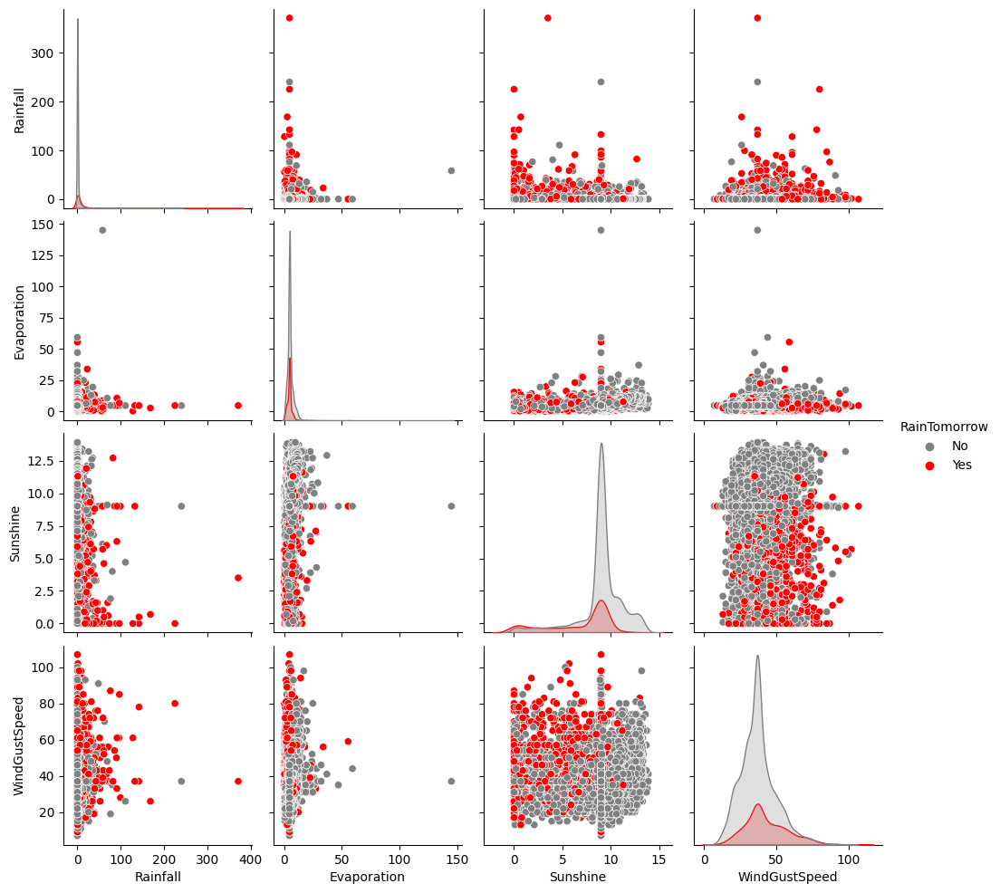

In [99]:
custom_palette = sns.color_palette(["#808080", "#FF0000"])
sns.pairplot( data=df, vars=('Rainfall','Evaporation', 'Sunshine', 'WindGustSpeed'), hue='RainTomorrow',palette = custom_palette)
plt.show()

- Rainfall and evaporation shows that there is a positive relationship between the two variables, meaning that days with higher evaporation rates tend to have more rainfall.

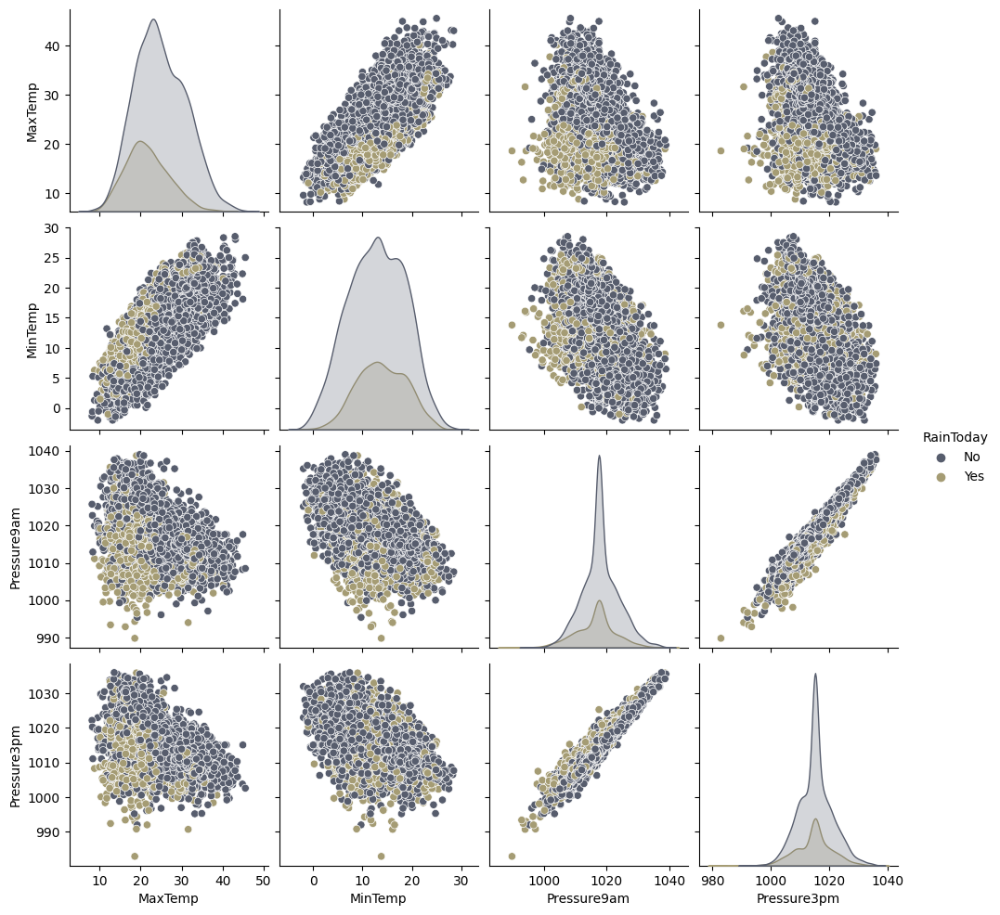

In [100]:
sns.pairplot( data=df, vars=('MaxTemp','MinTemp','Pressure9am','Pressure3pm'), hue='RainToday' , palette = 'cividis')
plt.show()

The following pairs of features are having high correlation between them:

- MaxTemp and MinTemp
- Pressure9am and Pressure3pm


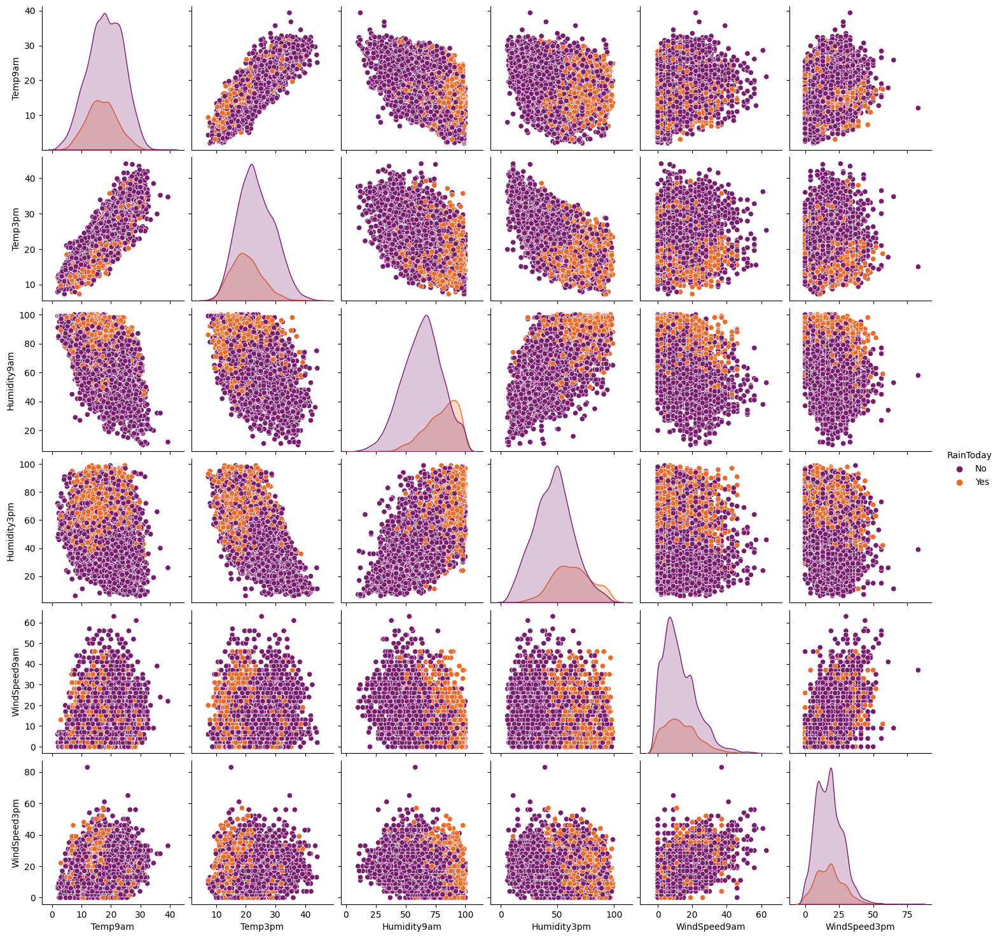

In [101]:
sns.pairplot( data=df, vars=('Temp9am', 'Temp3pm', 'Humidity9am', 'Humidity3pm','WindSpeed9am','WindSpeed3pm'), hue='RainToday',palette='inferno')
plt.show()

- There is a strong positive correlation between temperature and a negative correlation between humidity. This suggest that rainfall is more likely to occur when the temperature is high and the humidity is low.
- there is no correlatin between WindSpeed, Temp and Humidity

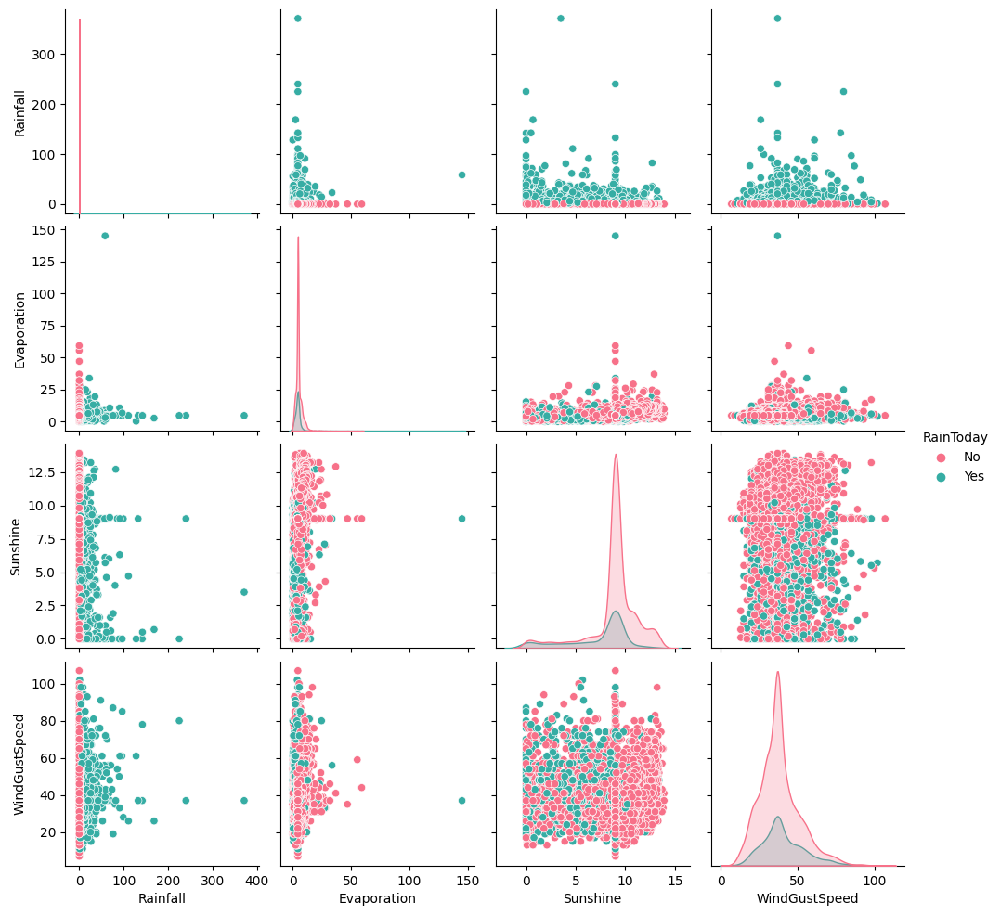

In [102]:
sns.pairplot( data=df, vars=('Rainfall','Evaporation','Sunshine', 'WindGustSpeed'), hue='RainToday',palette='husl' )
plt.show()

- Rainfall and evaporation shows that there is a positive relationship between the two variables, meaning that days with higher evaporation rates tend to have more rainfall.

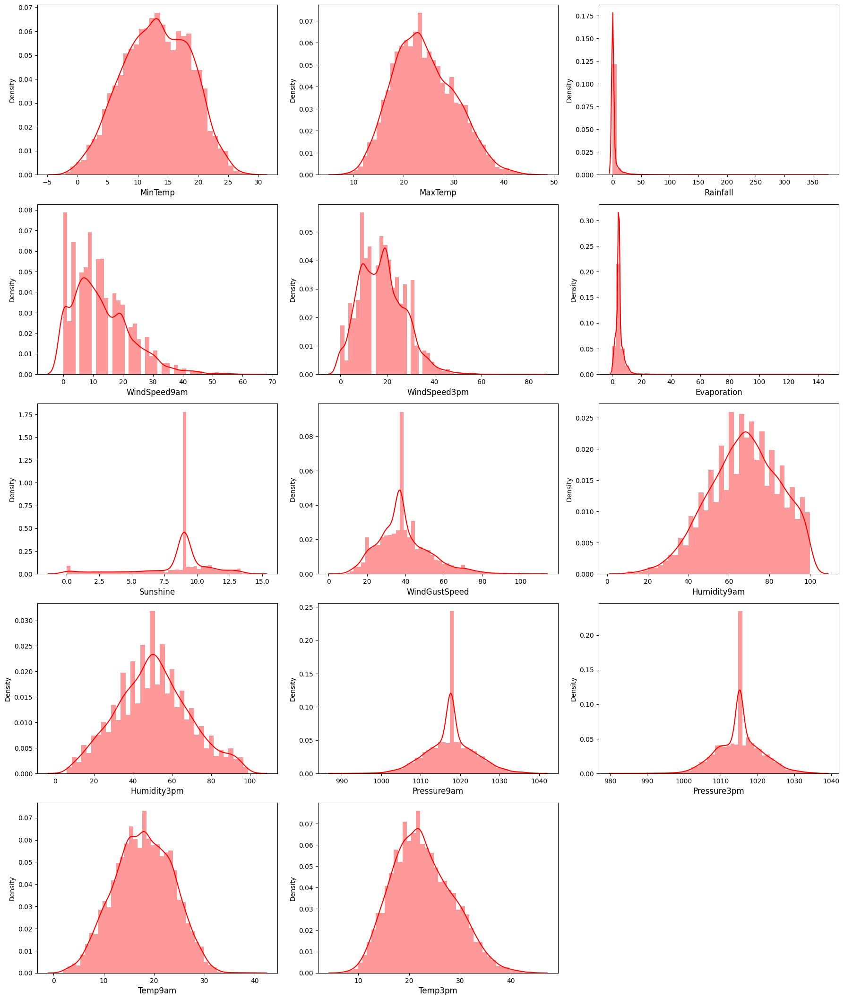

In [103]:
numerical_cols = ['MinTemp', 'MaxTemp', 'Rainfall','WindSpeed9am','WindSpeed3pm', 'Evaporation',
                  'Sunshine','WindGustSpeed','Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',
                  'Temp9am', 'Temp3pm']

plt.figure(figsize=(18, 25), facecolor='white')
plotnumber = 1

for col in numerical_cols:
    if plotnumber <= 16:
        ax = plt.subplot(6, 3, plotnumber)
        sns.distplot(df[col], color='r')
        plt.xlabel(col, fontsize=12)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber += 1

plt.tight_layout()
plt.show()

- Rainfall, Evaporation, Windspeed, WIndGutSpeed is Skewed with outliers

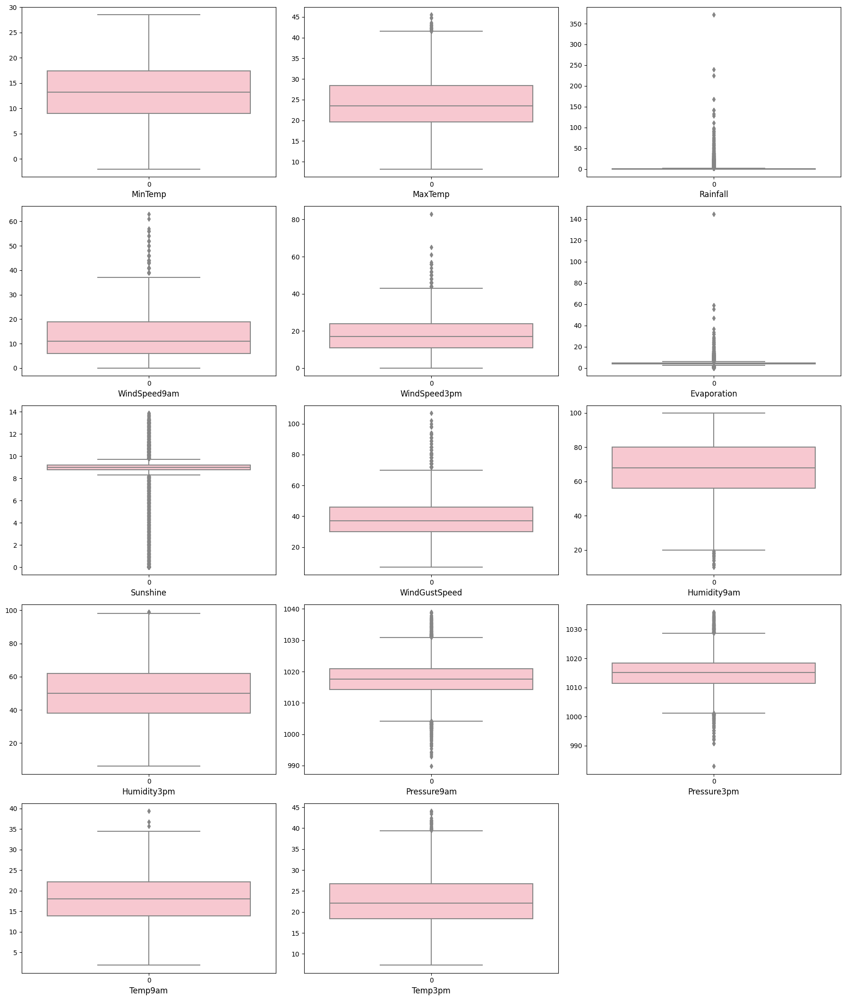

In [104]:
numerical_cols = ['MinTemp', 'MaxTemp', 'Rainfall','WindSpeed9am','WindSpeed3pm', 'Evaporation',
                  'Sunshine','WindGustSpeed','Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',
                  'Temp9am', 'Temp3pm']

plt.figure(figsize=(18, 25), facecolor='white')
plotnumber = 1

for col in numerical_cols:
    if plotnumber <= 16:
        ax = plt.subplot(6, 3, plotnumber)
        sns.boxplot(df[col], color='pink')
        plt.xlabel(col, fontsize=12)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber += 1

plt.tight_layout()
plt.show()

- There are outiers in the data which need to optimized using zscore

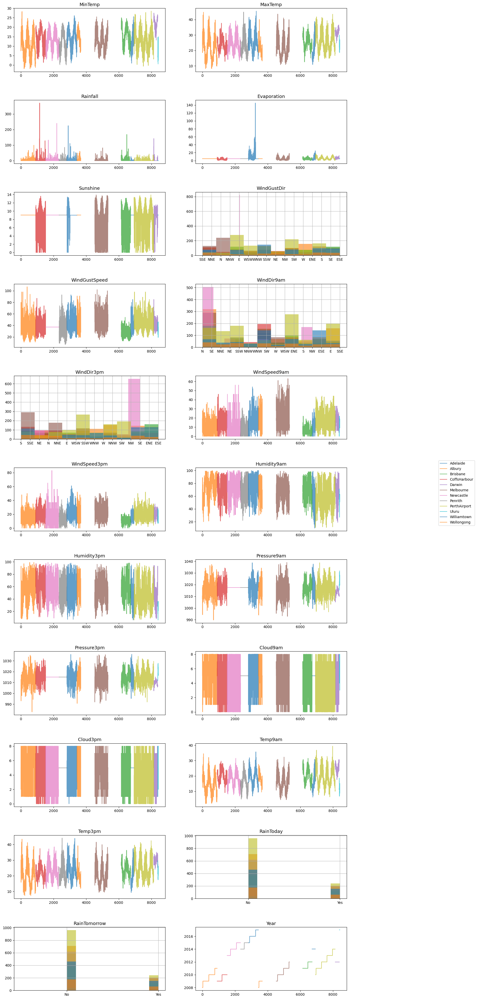

In [105]:
df['Location'] = df['Location'].astype(str) 

num_columns = 2  
num_rows = (len(df.columns[2:]) - 1) // num_columns + 1
fig, axes = plt.subplots(num_rows, num_columns, figsize=(18, 50), dpi=100)  

for i, col_name in enumerate(df.columns[2:]):
    row_index = i // num_columns
    col_index = i % num_columns

    if df[col_name].dtype == 'O': 
        
        df.groupby('Location')[col_name].hist(ax=axes[row_index, col_index], alpha=0.6)
    else:
        
        df.groupby('Location')[col_name].plot(ax=axes[row_index, col_index], alpha=0.7)

    axes[row_index, col_index].set_title(f'{col_name}', fontsize=13)


handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', borderaxespad=0.0)

plt.subplots_adjust(hspace=0.45, right=0.85)
plt.show()


-  distribution of rainfall for each location, with each feature

### Encoding

In [106]:
from sklearn.preprocessing import LabelEncoder

def encode_categorical_columns(df, columns):
    """
    Encode categorical columns in a DataFrame using LabelEncoder.

    Parameters:
    - df: DataFrame
    - columns: list of column names to be encoded

    Returns:
    - DataFrame: DataFrame with encoded columns
    - dict: Mapping of label encoders for each column
    """

    label_encoders = {}

    for column in columns:
        le = LabelEncoder()
        df[column] = le.fit_transform(df[column])
        label_encoders[column] = le

    return df, label_encoders

# Assuming df is your DataFrame, and you want to encode 'type' and 'region'
encoded_df, encoders = encode_categorical_columns(df, ['Location','WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday','Cloud9am','Cloud3pm', 'RainTomorrow'])
encoders

{'Location': LabelEncoder(),
 'WindGustDir': LabelEncoder(),
 'WindDir9am': LabelEncoder(),
 'WindDir3pm': LabelEncoder(),
 'RainToday': LabelEncoder(),
 'Cloud9am': LabelEncoder(),
 'Cloud3pm': LabelEncoder(),
 'RainTomorrow': LabelEncoder()}

In [107]:
df = encoded_df

In [108]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year
0,2008-12-01,1,13.4,22.9,0.6,4.6,9.0,13,44.0,13,...,22.0,1007.7,1007.1,8,5,16.9,21.8,0,0,2008
1,2008-12-02,1,7.4,25.1,0.0,4.6,9.0,14,44.0,6,...,25.0,1010.6,1007.8,5,5,17.2,24.3,0,0,2008
2,2008-12-03,1,12.9,25.7,0.0,4.6,9.0,15,46.0,13,...,30.0,1007.6,1008.7,5,2,21.0,23.2,0,0,2008
3,2008-12-04,1,9.2,28.0,0.0,4.6,9.0,4,24.0,9,...,16.0,1017.6,1012.8,5,5,18.1,26.5,0,0,2008
4,2008-12-05,1,17.5,32.3,1.0,4.6,9.0,13,41.0,1,...,33.0,1010.8,1006.0,7,8,17.8,29.7,0,0,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,9,2.8,23.4,0.0,4.6,9.0,0,31.0,9,...,24.0,1024.6,1020.3,5,5,10.1,22.4,0,0,2017
8421,2017-06-22,9,3.6,25.3,0.0,4.6,9.0,6,22.0,9,...,21.0,1023.5,1019.1,5,5,10.9,24.5,0,0,2017
8422,2017-06-23,9,5.4,26.9,0.0,4.6,9.0,3,37.0,9,...,24.0,1021.0,1016.8,5,5,12.5,26.1,0,0,2017
8423,2017-06-24,9,7.8,27.0,0.0,4.6,9.0,9,28.0,10,...,24.0,1019.4,1016.5,3,2,15.1,26.0,0,0,2017


In [109]:
df.shape

(6762, 24)

In [110]:
df.drop(columns = ['Date','Year'],axis=1, inplace = True)

### Skewness of data

In [111]:
df[['MinTemp', 'MaxTemp', 'Rainfall', 'WindSpeed9am', 'WindSpeed3pm', 'Evaporation',
    'Sunshine', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',
    'Temp9am', 'Temp3pm']].skew()


MinTemp          -0.084215
MaxTemp           0.330020
Rainfall         13.637400
WindSpeed9am      0.961630
WindSpeed3pm      0.552405
Evaporation      13.603792
Sunshine         -1.378286
WindGustSpeed     0.838665
Humidity9am      -0.256862
Humidity3pm       0.151933
Pressure9am       0.024619
Pressure3pm       0.044933
Temp9am          -0.047627
Temp3pm           0.352174
dtype: float64

In [112]:
df.dtypes

Location           int32
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir        int32
WindGustSpeed    float64
WindDir9am         int32
WindDir3pm         int32
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am           int64
Cloud3pm           int64
Temp9am          float64
Temp3pm          float64
RainToday          int32
RainTomorrow       int32
dtype: object

In [113]:
from scipy.stats import boxcox
from scipy.stats import skew

numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
skewness_before = df[numerical_cols].apply(lambda x: skew(x))


for col in numerical_cols:
    if skewness_before[col] > 0.5:  
        if df[col].min() > 0:
            df[col], _ = boxcox(df[col] + 1)  
        else:
            df[col] = boxcox(df[col] - df[col].min() + 1)[0] 


skewness_after = df[numerical_cols].apply(lambda x: skew(x))

skewness_summary = pd.DataFrame({'Skewness Before': skewness_before, 'Skewness After': skewness_after})
print("Skewness Summary:")
print(skewness_summary)

Skewness Summary:
               Skewness Before  Skewness After
MinTemp              -0.084196       -0.084196
MaxTemp               0.329946        0.329946
Rainfall             13.634375        1.046232
Evaporation          13.600774        0.033476
Sunshine             -1.377981       -1.377981
WindGustSpeed         0.838479        0.012803
WindSpeed9am          0.961417       -0.097946
WindSpeed3pm          0.552283       -0.038488
Humidity9am          -0.256805       -0.256805
Humidity3pm           0.151900        0.151900
Pressure9am           0.024613        0.024613
Pressure3pm           0.044923        0.044923
Cloud9am             -0.425989       -0.425989
Cloud3pm             -0.396246       -0.396246
Temp9am              -0.047617       -0.047617
Temp3pm               0.352095        0.352095


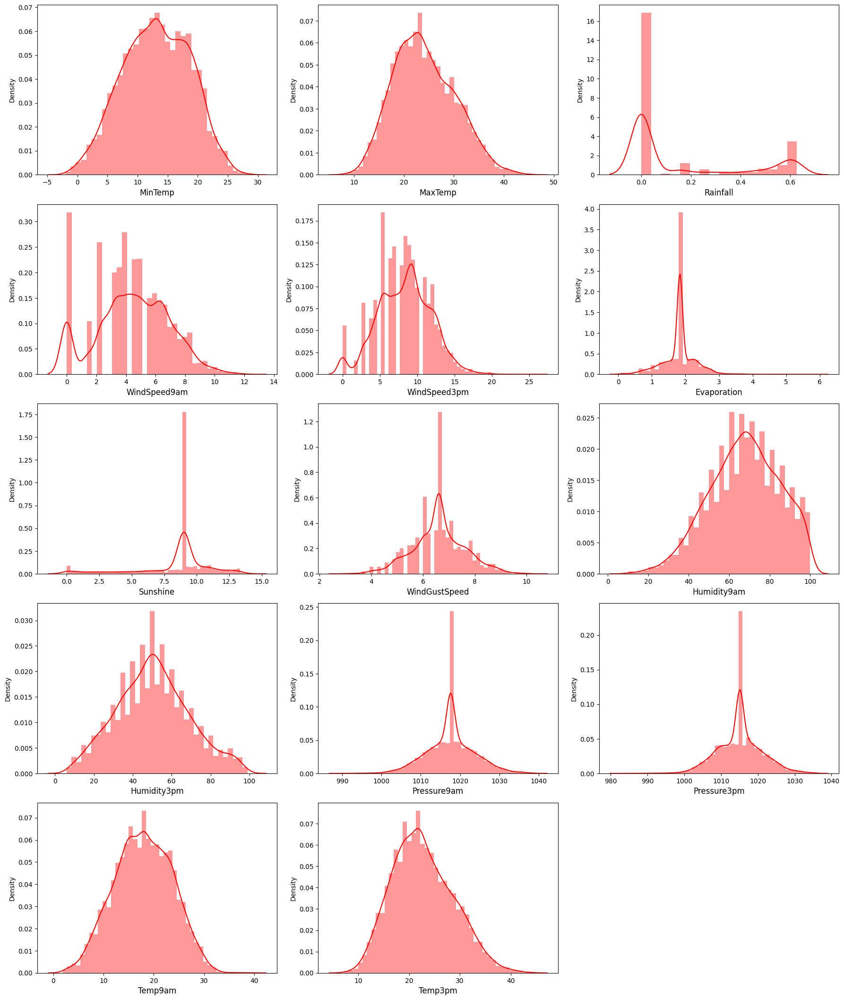

In [114]:
numerical_cols = ['MinTemp', 'MaxTemp', 'Rainfall','WindSpeed9am','WindSpeed3pm', 'Evaporation',
                  'Sunshine','WindGustSpeed','Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',
                  'Temp9am', 'Temp3pm']

plt.figure(figsize=(18, 25), facecolor='white')
plotnumber = 1

for col in numerical_cols:
    if plotnumber <= 16:
        ax = plt.subplot(6, 3, plotnumber)
        sns.distplot(df[col], color='r')
        plt.xlabel(col, fontsize=12)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber += 1

plt.tight_layout()
plt.show()

In [115]:
df[['MinTemp', 'MaxTemp', 'Rainfall', 'WindSpeed9am', 'WindSpeed3pm', 'Evaporation',
    'Sunshine', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',
    'Temp9am', 'Temp3pm']].skew()

MinTemp         -0.084215
MaxTemp          0.330020
Rainfall         1.046464
WindSpeed9am    -0.097967
WindSpeed3pm    -0.038497
Evaporation      0.033484
Sunshine        -1.378286
WindGustSpeed    0.012806
Humidity9am     -0.256862
Humidity3pm      0.151933
Pressure9am      0.024619
Pressure3pm      0.044933
Temp9am         -0.047627
Temp3pm          0.352174
dtype: float64

- It appears that the data is within the acceptable skewness range, indicating a balanced distribution without excessive asymmetry. This suggests a relatively normal or symmetric pattern in the dataset.

### Checking for Outliers

In [116]:
from scipy.stats import zscore

numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

z_scores = np.abs(zscore(df[numerical_cols]))
threshold = 3

outlier_mask = (z_scores > threshold).any(axis=1)


df_no_outliers = df[~outlier_mask]

print(f"Shape before removing outliers: {df.shape}")
print(f"Shape after removing outliers: {df_no_outliers.shape}")

Shape before removing outliers: (6762, 22)
Shape after removing outliers: (6447, 22)


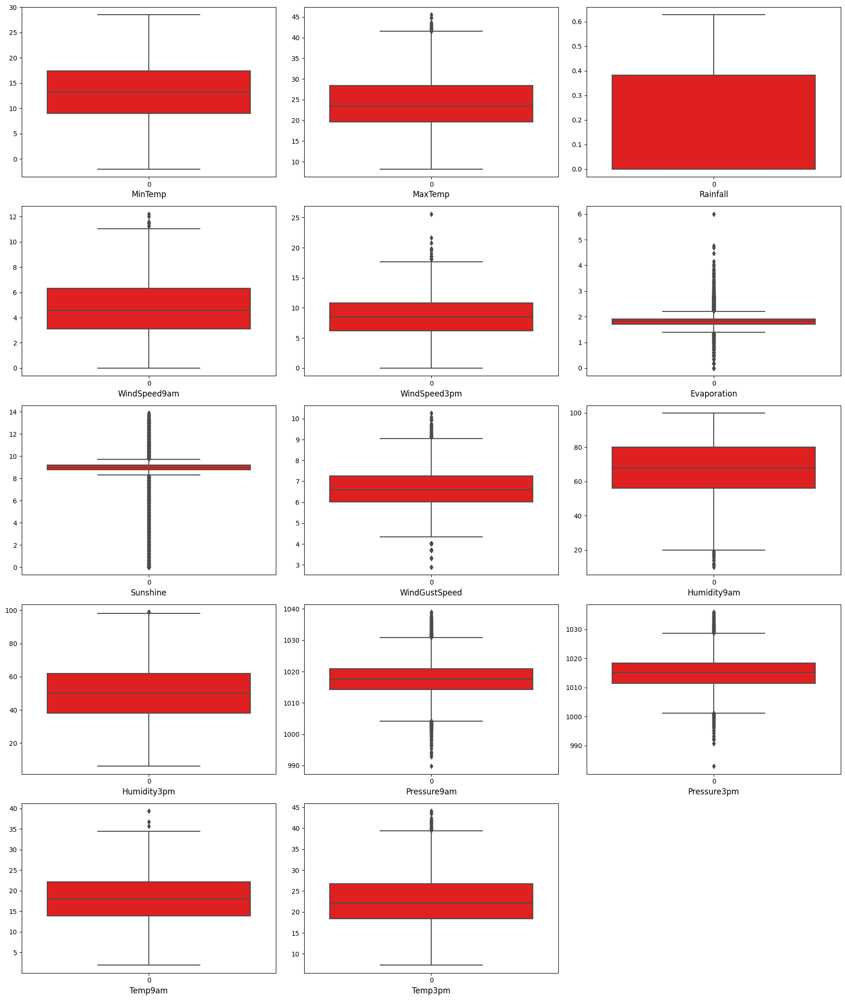

In [117]:
numerical_cols = ['MinTemp', 'MaxTemp', 'Rainfall','WindSpeed9am','WindSpeed3pm', 'Evaporation',
                  'Sunshine','WindGustSpeed','Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',
                  'Temp9am', 'Temp3pm']

plt.figure(figsize=(18, 25), facecolor='white')
plotnumber = 1

for col in numerical_cols:
    if plotnumber <= 16:
        ax = plt.subplot(6, 3, plotnumber)
        sns.boxplot(df[col], color='r')
        plt.xlabel(col, fontsize=12)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber += 1

plt.tight_layout()
plt.show()

- By employing the z-score, we have effectively managed outliers within the dataset

### Collinear relationship among features

In [118]:
df.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,1.000000,0.090455,0.070761,0.002191,0.123319,0.068411,-0.086385,0.272120,-0.088884,-0.001275,...,-0.033586,-0.001569,-0.037942,-0.024722,-0.017268,-0.021092,0.098576,0.066010,-0.004280,-0.004506
MinTemp,0.090455,1.000000,0.728059,0.076420,0.365740,0.001976,-0.136435,0.268528,-0.020884,-0.139534,...,-0.154218,0.067847,-0.441143,-0.440282,0.073205,0.022233,0.891417,0.696861,0.075902,0.097173
MaxTemp,0.070761,0.728059,1.000000,-0.252425,0.463626,0.323262,-0.194877,0.186802,-0.192277,-0.161038,...,-0.425100,-0.430599,-0.337744,-0.413056,-0.247744,-0.246742,0.866654,0.974994,-0.225526,-0.160063
Rainfall,0.002191,0.076420,-0.252425,1.000000,-0.193663,-0.277226,0.115569,0.079943,0.161015,0.111527,...,0.436813,0.419464,-0.117123,-0.040727,0.315770,0.273069,-0.106810,-0.263438,0.939472,0.350152
Evaporation,0.123319,0.365740,0.463626,-0.193663,1.000000,0.382131,-0.114719,0.194991,-0.090212,-0.037979,...,-0.335145,-0.246136,-0.266398,-0.285561,-0.115734,-0.157933,0.433396,0.452653,-0.171684,-0.102057
Sunshine,0.068411,0.001976,0.323262,-0.277226,0.382131,1.000000,-0.114589,-0.009221,-0.093530,-0.041657,...,-0.327091,-0.428461,0.003736,-0.050353,-0.488498,-0.515504,0.185468,0.344193,-0.249807,-0.337550
WindGustDir,-0.086385,-0.136435,-0.194877,0.115569,-0.114719,-0.114589,1.000000,0.019331,0.378772,0.455305,...,0.015063,0.025824,-0.100428,-0.023902,0.133483,0.095415,-0.153390,-0.207326,0.112410,0.045179
WindGustSpeed,0.272120,0.268528,0.186802,0.079943,0.194991,-0.009221,0.019331,1.000000,-0.061304,0.087644,...,-0.291943,-0.103430,-0.387387,-0.354398,-0.006266,0.032659,0.252524,0.151580,0.085259,0.173496
WindDir9am,-0.088884,-0.020884,-0.192277,0.161015,-0.090212,-0.093530,0.378772,-0.061304,1.000000,0.216648,...,0.015394,0.126914,-0.027334,0.051862,0.079251,0.058186,-0.071205,-0.200530,0.157884,0.040399
WindDir3pm,-0.001275,-0.139534,-0.161038,0.111527,-0.037979,-0.041657,0.455305,0.087644,0.216648,1.000000,...,-0.005547,-0.009709,-0.139029,-0.049335,0.075979,0.055951,-0.146437,-0.175251,0.094507,0.004301


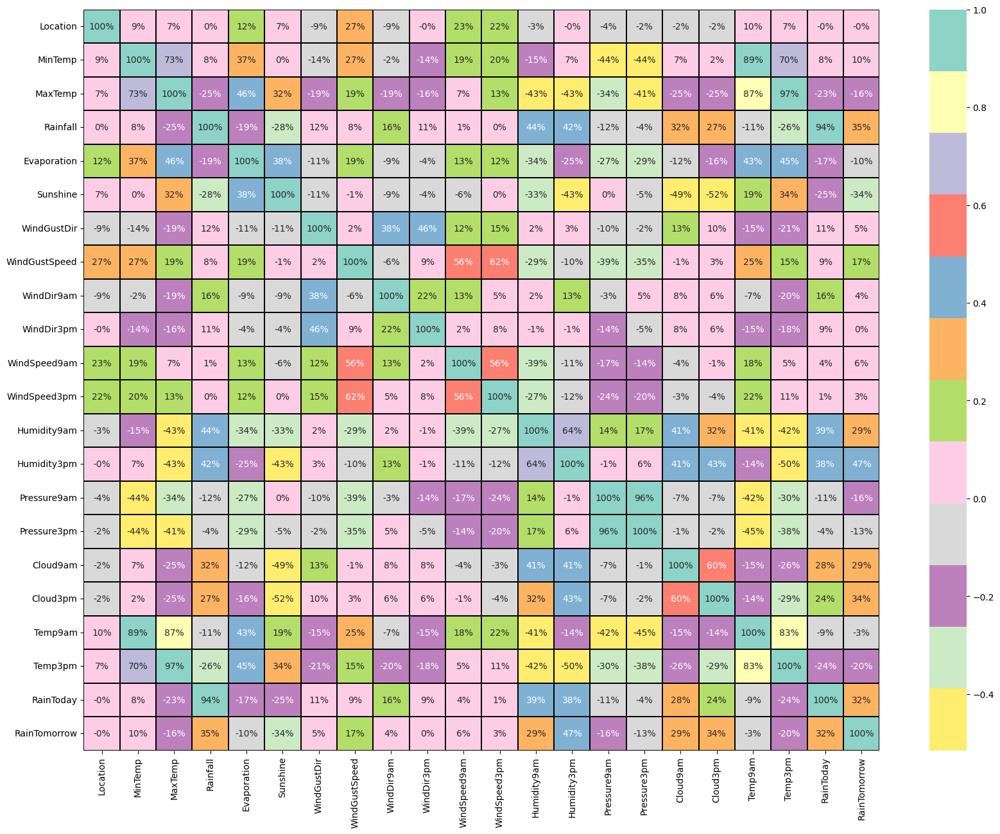

In [119]:
plt.figure(figsize = (20,15))
sns.heatmap(df.corr(), linewidths=0.1, fmt = '0.0%', linecolor ='black', annot = True, cmap = 'Set3_r',annot_kws={'size' : 10})
plt.yticks(rotation=0)
plt.show()

In [120]:
data = df.copy()

### Prediction for RainToday

In [121]:
data.corr()['RainToday'].sort_values(ascending = False)

RainToday        1.000000
Rainfall         0.939472
Humidity9am      0.387204
Humidity3pm      0.375991
RainTomorrow     0.323691
Cloud9am         0.282905
Cloud3pm         0.242232
WindDir9am       0.157884
WindGustDir      0.112410
WindDir3pm       0.094507
WindGustSpeed    0.085259
MinTemp          0.075902
WindSpeed9am     0.035103
WindSpeed3pm     0.007967
Location        -0.004280
Pressure3pm     -0.041096
Temp9am         -0.090764
Pressure9am     -0.111977
Evaporation     -0.171684
MaxTemp         -0.225526
Temp3pm         -0.236080
Sunshine        -0.249807
Name: RainToday, dtype: float64

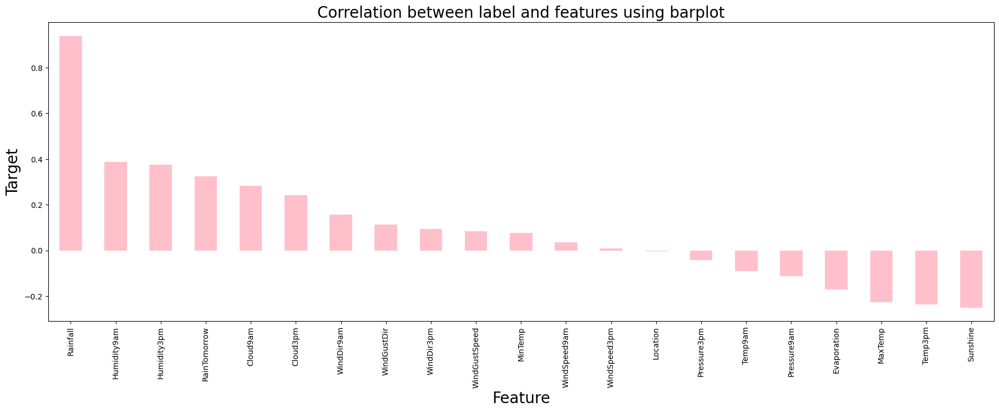

In [122]:
plt.figure(figsize = (22,7))
data.corr()['RainToday'].sort_values(ascending = False).drop(['RainToday']).plot(kind='bar',color='pink')
plt.xlabel('Feature', fontsize = 20)
plt.ylabel('Target',fontsize = 20)
plt.title('Correlation between label and features using barplot',fontsize = 20)
plt.show()

### Separating features from target variable

In [123]:
x=df.drop(columns=['RainToday'],axis=1)
y=df['RainToday']

### Standardization

In [124]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
0,-1.395097,0.052329,-0.194668,0.697862,0.036387,0.207361,1.220923,0.498309,1.315650,1.372365,...,0.718127,0.203097,-1.538651,-1.645999,-1.343353,1.396453,0.208282,-0.174035,-0.150755,-0.550355
1,-1.395097,-1.030652,0.164227,-0.654104,0.036387,0.207361,1.412005,0.498309,-0.222688,1.595253,...,0.532428,-1.368362,-1.376463,-1.164869,-1.226045,0.192678,0.208282,-0.121606,0.267878,-0.550355
2,-1.395097,-0.037920,0.262108,-0.654104,0.036387,0.207361,1.603087,0.634082,1.315650,1.595253,...,0.898643,-1.717576,-1.106150,-1.662590,-1.075221,0.192678,-1.072084,0.542498,0.083680,-0.550355
3,-1.395097,-0.705758,0.637317,-0.654104,0.036387,0.207361,-0.498814,-1.172832,0.436600,-1.748064,...,-0.863496,-1.310160,-1.863027,-0.003521,-0.388132,0.192678,0.208282,0.035682,0.636275,-0.550355
4,-1.395097,0.792365,1.338795,1.060659,0.036387,0.207361,1.220923,0.286504,-1.321500,-0.187849,...,0.340926,0.843321,-0.943962,-1.131688,-1.527694,0.995194,1.488648,-0.016748,1.172125,-0.550355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6757,1.186193,-1.860937,-0.113101,-0.654104,0.036387,0.207361,-1.263141,-0.506787,0.436600,-1.525176,...,-0.618721,-0.960947,-1.430526,1.157828,0.868739,0.192678,0.208282,-1.362432,-0.050283,-0.550355
6758,1.186193,-1.716540,0.196854,-0.654104,0.036387,0.207361,-0.116650,-1.386854,0.436600,-1.079401,...,-0.863496,-0.669936,-1.592714,0.975330,0.667639,0.192678,0.208282,-1.222621,0.301369,-0.550355
6759,1.186193,-1.391646,0.457869,-0.654104,0.036387,0.207361,-0.689895,-0.013036,0.436600,1.372365,...,-0.863496,-0.844543,-1.430526,0.560563,0.282199,0.192678,0.208282,-0.942998,0.569294,-0.550355
6760,1.186193,-0.958453,0.474183,-0.654104,0.036387,0.207361,0.456596,-0.778329,0.656363,-1.079401,...,-1.126345,-0.960947,-1.430526,0.295112,0.231924,-0.609839,-1.072084,-0.488611,0.552548,-0.550355


### Multicollinearity

In [125]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.163097,Location
1,8.767947,MinTemp
2,26.859050,MaxTemp
3,1.560064,Rainfall
4,1.543633,Evaporation
5,1.852023,Sunshine
6,1.532549,WindGustDir
7,2.349316,WindGustSpeed
8,1.329358,WindDir9am
9,1.417455,WindDir3pm


In [126]:
x.drop(columns = ['Temp3pm'],axis = 1, inplace=True)

In [127]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.162859,Location
1,8.676765,MinTemp
2,9.815078,MaxTemp
3,1.559630,Rainfall
4,1.543033,Evaporation
5,1.851957,Sunshine
6,1.529725,WindGustDir
7,2.337410,WindGustSpeed
8,1.328419,WindDir9am
9,1.416278,WindDir3pm


In [128]:
x.drop(columns = ['Pressure9am'],axis = 1, inplace=True)

In [129]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.161908,Location
1,8.552146,MinTemp
2,9.448961,MaxTemp
3,1.540549,Rainfall
4,1.533825,Evaporation
5,1.850499,Sunshine
6,1.516245,WindGustDir
7,2.311641,WindGustSpeed
8,1.306071,WindDir9am
9,1.338344,WindDir3pm


In [130]:
x.drop(columns = ['Temp9am'],axis = 1, inplace=True)

In [131]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.154917,Location
1,4.637708,MinTemp
2,5.579122,MaxTemp
3,1.532796,Rainfall
4,1.531703,Evaporation
5,1.847498,Sunshine
6,1.515283,WindGustDir
7,2.277270,WindGustSpeed
8,1.304889,WindDir9am
9,1.338150,WindDir3pm


In [132]:
y.value_counts()

RainToday
0    5190
1    1572
Name: count, dtype: int64

- The dataset seems to be imbalanced, as the count for 'RainTodat' category 0 is significantly larger than category 1.

### Balancing the Dataset Through Oversampling

In [133]:
# Oversampling the data
import imblearn
from imblearn.over_sampling import SMOTE  
sm = SMOTE()
x,y = sm.fit_resample(x,y)

In [134]:
y.value_counts()

RainToday
0    5190
1    5190
Name: count, dtype: int64

### Modelling

In [135]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [136]:
maxAccu = 0
maxRs = 0                       
for i in range(1,200):
    x_train, x_test,y_train,y_test = train_test_split(x,y,test_size =0.20, random_state=i)
    rf = RandomForestClassifier()
    rf.fit(x_train,y_train)
    pred = rf.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
print('Best accuracy is ', maxAccu, 'at random_state', maxRS)

Best accuracy is  1.0 at random_state 1


In [137]:
x_train, x_test,y_train,y_test = train_test_split(x,y,test_size =0.30, random_state=maxRS)

In [138]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier,BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

### RandomForestClassifier

In [139]:
RFC = RandomForestClassifier()                    
RFC.fit(x_train,y_train)
predRFC = RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

1.0
[[1599    0]
 [   0 1515]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1599
           1       1.00      1.00      1.00      1515

    accuracy                           1.00      3114
   macro avg       1.00      1.00      1.00      3114
weighted avg       1.00      1.00      1.00      3114



### LogisticRegression

In [140]:
LR = LogisticRegression()
LR.fit(x_train,y_train)
predLR = LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test,predLR))
print(classification_report(y_test,predLR))

0.9971098265895953
[[1590    9]
 [   0 1515]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1599
           1       0.99      1.00      1.00      1515

    accuracy                           1.00      3114
   macro avg       1.00      1.00      1.00      3114
weighted avg       1.00      1.00      1.00      3114



### KNeighborsClassifier

In [141]:
knn = KNeighborsClassifier()                    
knn.fit(x_train,y_train)
predknn = knn.predict(x_test)
print(accuracy_score(y_test,predknn))
print(confusion_matrix(y_test,predknn))
print(classification_report(y_test,predknn))

0.9707771355170199
[[1512   87]
 [   4 1511]]
              precision    recall  f1-score   support

           0       1.00      0.95      0.97      1599
           1       0.95      1.00      0.97      1515

    accuracy                           0.97      3114
   macro avg       0.97      0.97      0.97      3114
weighted avg       0.97      0.97      0.97      3114



### GradientBoostingClassifier

In [142]:
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB = GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))

1.0
[[1599    0]
 [   0 1515]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1599
           1       1.00      1.00      1.00      1515

    accuracy                           1.00      3114
   macro avg       1.00      1.00      1.00      3114
weighted avg       1.00      1.00      1.00      3114



### AdaBoostClassifier

In [143]:
ABC = AdaBoostClassifier()
ABC .fit(x_train,y_train)
predABC  = ABC .predict(x_test)
print(accuracy_score(y_test,predABC ))
print(confusion_matrix(y_test,predABC ))
print(classification_report(y_test,predABC ))

1.0
[[1599    0]
 [   0 1515]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1599
           1       1.00      1.00      1.00      1515

    accuracy                           1.00      3114
   macro avg       1.00      1.00      1.00      3114
weighted avg       1.00      1.00      1.00      3114



### BaggingClassifier

In [144]:
BC = BaggingClassifier()
BC.fit(x_train,y_train)
predBC = BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test,predBC))
print(classification_report(y_test,predBC))

1.0
[[1599    0]
 [   0 1515]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1599
           1       1.00      1.00      1.00      1515

    accuracy                           1.00      3114
   macro avg       1.00      1.00      1.00      3114
weighted avg       1.00      1.00      1.00      3114



### SupportVectorclassifier

In [145]:
svc=SVC()
svc.fit(x_train,y_train)
predsvc = svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

0.9919717405266538
[[1574   25]
 [   0 1515]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1599
           1       0.98      1.00      0.99      1515

    accuracy                           0.99      3114
   macro avg       0.99      0.99      0.99      3114
weighted avg       0.99      0.99      0.99      3114



### ExtraTreesClassifier

In [146]:
ET = ExtraTreesClassifier()
ET.fit(x_train,y_train)
predET = ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test,predET))
print(classification_report(y_test,predET))

0.9983943481053308
[[1594    5]
 [   0 1515]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1599
           1       1.00      1.00      1.00      1515

    accuracy                           1.00      3114
   macro avg       1.00      1.00      1.00      3114
weighted avg       1.00      1.00      1.00      3114



### Cross Validation Score

In [147]:
from sklearn.model_selection import cross_val_score

### RandomForestClassifier

In [148]:
score1 = cross_val_score(RFC,x,y)
print(score1)
print('RFC score:',score1.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predRFC)-score1.mean())

[1. 1. 1. 1. 1.]
RFC score: 1.0
Difference between Accuracy score and cross validation is:  0.0


### LogisticRegression

In [149]:
score2 = cross_val_score(LR,x,y)
print(score2)
print('LR score:',score2.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predLR)-score2.mean())

[0.99566474 0.98651252 0.99614644 0.99855491 0.99566474]
LR score: 0.9945086705202313
Difference between Accuracy score and cross validation is:  0.0026011560693640634


### KNeighborsClassifier

In [150]:
score3 = cross_val_score(knn,x,y)
print(score3)
print('knn score:',score3.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predknn)-score3.mean())

[0.92967245 0.84633911 0.9238921  0.96531792 0.96339114]
knn score: 0.9257225433526012
Difference between Accuracy score and cross validation is:  0.04505459216441876


### GradientBoostClassifier

In [151]:
score4 = cross_val_score(GB,x,y)
print(score4)
print('GB score:',score4.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predGB)-score4.mean())

[1. 1. 1. 1. 1.]
GB score: 1.0
Difference between Accuracy score and cross validation is:  0.0


### AdaBoostClassifier

In [152]:
score5 = cross_val_score(ABC,x,y)
print(score5)
print('ABC score:',score5.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predABC)-score5.mean())

[1. 1. 1. 1. 1.]
ABC score: 1.0
Difference between Accuracy score and cross validation is:  0.0


### BaggingClassifier

In [153]:
score6 = cross_val_score(BC,x,y)
print(score6)
print('BC score:',score6.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predBC)-score6.mean())

[1. 1. 1. 1. 1.]
BC score: 1.0
Difference between Accuracy score and cross validation is:  0.0


### Support Vector Machine Classifier

In [154]:
score7 = cross_val_score(svc,x,y)
print(score7)
print('svc score:',score7.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predsvc)-score7.mean())

[0.98747592 0.97591522 0.98795761 0.99325626 0.9894027 ]
svc score: 0.9868015414258189
Difference between Accuracy score and cross validation is:  0.005170199100834938


### ExtraTreesClassifier

In [155]:
score8 = cross_val_score(ET,x,y)
print(score8)
print('ET score:',score8.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predET)-score8.mean())

[0.99566474 0.98506744 0.99084778 0.99855491 0.99277457]
ET score: 0.9925818882466281
Difference between Accuracy score and cross validation is:  0.005812459858702712


### Compare accuracy of models

In [156]:
pd.DataFrame([['Support Vector Machine',score7.mean()*100],['Extra Trees Classifier',score8.mean()*100],['Gradient Boost Classifier',score4.mean()*100],
              ['LogisticRegression',score2.mean()*100],['Random Forest Classifier',score1.mean()*100],['KNeighborsClassifier',score3.mean()*100],['AdaBoostClassifier',score5.mean()*100],
              ['Bagging Classifier',score6.mean()*100]],columns=['Models','Accuracy'])

,Models,Accuracy
0,Support Vector Machine,98.680154
1,Extra Trees Classifier,99.258189
2,Gradient Boost Classifier,100.000000
3,LogisticRegression,99.450867
4,Random Forest Classifier,100.000000
5,KNeighborsClassifier,92.572254
6,AdaBoostClassifier,100.000000
7,Bagging Classifier,100.000000


 **The model selected is RandomForestClassifier**
- Accuracy score : 100.0%
- cross_val_score: 100.0%
- Difference between Accuracy score and cross validation is: 0.0

### Hyperparameter Tuning

In [157]:
from sklearn.model_selection import GridSearchCV

In [158]:
# RandomForestClassifier
params = {'n_estimators':[13,15,17,19,21],             
          'criterion':['entropy','gini'],
          'max_depth':[10,15],
          'min_samples_split':[10,11],
          'min_samples_leaf':[5,6],
          'n_jobs': [-2,-1,1],
          'random_state':[10,50,1000]}

In [159]:
GCV = GridSearchCV(RandomForestClassifier(),param_grid=params,cv=5)
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': [10, 15], 'min_samples_leaf': [5, 6],
                         'min_samples_split': [10, 11],
                         'n_estimators': [13, 15, 17, 19, 21],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [160]:
print('best params :', GCV.best_params_) 

best params : {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 5, 'min_samples_split': 10, 'n_estimators': 13, 'n_jobs': -2, 'random_state': 10}


In [161]:
Final_model = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features=2,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [162]:
Final_model.fit(x_train,y_train)
pred = Final_model.predict(x_test)
acc = accuracy_score(y_test,pred)
print(f"Accuracy: {acc * 100:.2f}%")

Accuracy: 100.00%


In [163]:
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

[[1599    0]
 [   0 1515]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1599
           1       1.00      1.00      1.00      1515

    accuracy                           1.00      3114
   macro avg       1.00      1.00      1.00      3114
weighted avg       1.00      1.00      1.00      3114



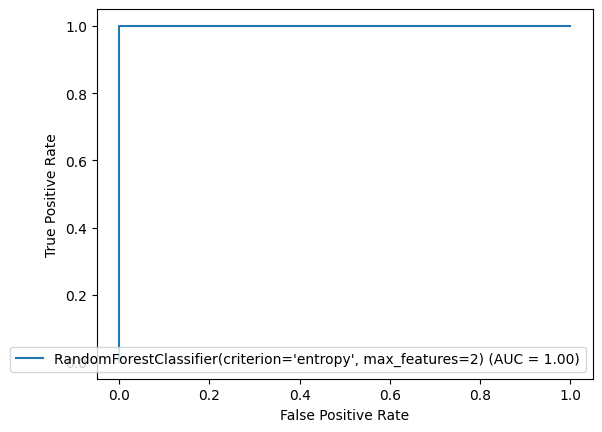

In [164]:
from sklearn import metrics
fpr,tpr,thresholds = metrics.roc_curve(y_test,pred)
roc_auc = metrics.auc(fpr,tpr)
display = metrics.RocCurveDisplay(fpr=fpr,tpr=tpr, roc_auc=roc_auc,estimator_name = Final_model)
display.plot()

- With criterion set to entropy and max_features limited to 2, achieving AUC=1 indicates a perfect model where the true positive rate is 1 and the false positive rate is 0, showcasing ideal discrimination between positive and negative instances.

In [165]:
import pickle
with open('Rainfall_Forecasting_RainToday.pkl', 'wb') as file:
    pickle.dump(Final_model, file)

In [166]:
with open('Rainfall_Forecasting_RainToday.pkl', 'rb') as file:
    model = pickle.load(file)
    result = model.score(x_test,y_test)
    print(result*100)

100.0


In [167]:
rfc=np.array(y_test)
rainfallToday_forecast = pd.DataFrame()
rainfallToday_forecast['Predicted'] =pred
rainfallToday_forecast['Actual'] = rfc
rainfallToday_forecast

,Predicted,Actual
0,1,1
1,1,1
2,0,0
3,0,0
4,0,0
...,...,...
3109,0,0
3110,0,0
3111,0,0
3112,1,1


# Prediction for RainTomorrow

In [168]:
x['RainToday'] = df['RainToday']

- Adding RainToday column back into the dataFrame df

### Correlation between Label and Features

In [169]:
df.corr()['RainTomorrow'].sort_values(ascending = False)

RainTomorrow     1.000000
Humidity3pm      0.466880
Rainfall         0.350152
Cloud3pm         0.344434
RainToday        0.323691
Humidity9am      0.287808
Cloud9am         0.285715
WindGustSpeed    0.173496
MinTemp          0.097173
WindSpeed9am     0.056370
WindGustDir      0.045179
WindDir9am       0.040399
WindSpeed3pm     0.031676
WindDir3pm       0.004301
Location        -0.004506
Temp9am         -0.025768
Evaporation     -0.102057
Pressure3pm     -0.131771
Pressure9am     -0.159118
MaxTemp         -0.160063
Temp3pm         -0.202781
Sunshine        -0.337550
Name: RainTomorrow, dtype: float64

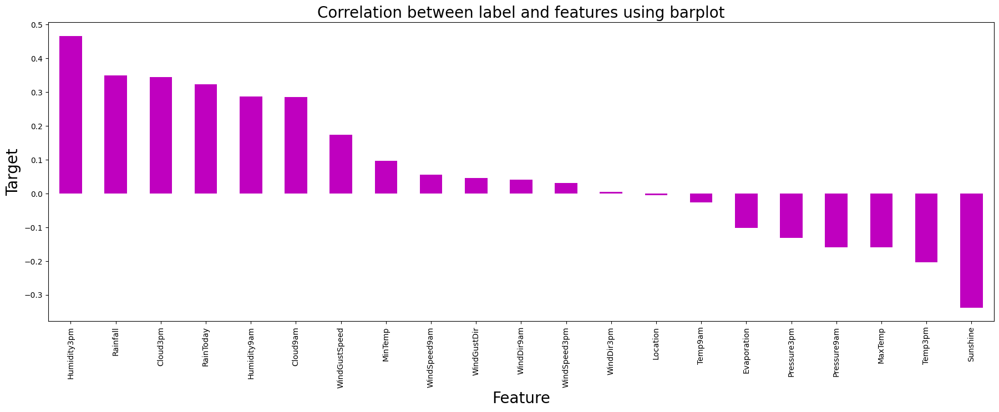

In [170]:
plt.figure(figsize = (22,7))
data.corr()['RainTomorrow'].sort_values(ascending = False).drop(['RainTomorrow']).plot(kind='bar',color='m')
plt.xlabel('Feature', fontsize = 20)
plt.ylabel('Target',fontsize = 20)
plt.title('Correlation between label and features using barplot',fontsize = 20)
plt.show()

**Strong Positive Correlations:**

- Humidity3pm (0.47): High humidity in the afternoon positively correlates with the likelihood of rain tomorrow.
- Rainfall (0.35): More rainfall increases the chance of rain tomorrow.
- Cloud3pm (0.34): Cloudiness in the afternoon is positively associated with rain tomorrow.
- RainToday (0.32): If it's raining today, there's a higher chance it will rain tomorrow.

**Moderate Positive Correlations:**

- Humidity9am (0.29): Morning humidity has a positive correlation with rain tomorrow.
- Cloud9am (0.29): Morning cloudiness is also positively correlated.

**Other Positive Correlations:**

- WindGustSpeed, MinTemp, and other features also have positive correlations but to a lesser extent.

**Negative Correlations:**

- Some features like Sunshine, Temp3pm, and MaxTemp have negative correlations, suggesting that lower values for these variables are associated with an increased chance of rain tomorrow.

**Weak Correlations:**

- Location seems to have a very weak correlation, and WindDir3pm has an extremely weak positive correlation.

### Separating features from target variable

In [171]:
x=df.drop(columns=['RainTomorrow'],axis=1)
y=df['RainTomorrow']

### Standardization of the data

In [172]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,-1.395097,0.052329,-0.194668,0.697862,0.036387,0.207361,1.220923,0.498309,1.315650,1.372365,...,0.718127,0.203097,-1.538651,-1.645999,-1.343353,1.396453,0.208282,-0.174035,-0.150755,-0.550355
1,-1.395097,-1.030652,0.164227,-0.654104,0.036387,0.207361,1.412005,0.498309,-0.222688,1.595253,...,0.532428,-1.368362,-1.376463,-1.164869,-1.226045,0.192678,0.208282,-0.121606,0.267878,-0.550355
2,-1.395097,-0.037920,0.262108,-0.654104,0.036387,0.207361,1.603087,0.634082,1.315650,1.595253,...,0.898643,-1.717576,-1.106150,-1.662590,-1.075221,0.192678,-1.072084,0.542498,0.083680,-0.550355
3,-1.395097,-0.705758,0.637317,-0.654104,0.036387,0.207361,-0.498814,-1.172832,0.436600,-1.748064,...,-0.863496,-1.310160,-1.863027,-0.003521,-0.388132,0.192678,0.208282,0.035682,0.636275,-0.550355
4,-1.395097,0.792365,1.338795,1.060659,0.036387,0.207361,1.220923,0.286504,-1.321500,-0.187849,...,0.340926,0.843321,-0.943962,-1.131688,-1.527694,0.995194,1.488648,-0.016748,1.172125,-0.550355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6757,1.186193,-1.860937,-0.113101,-0.654104,0.036387,0.207361,-1.263141,-0.506787,0.436600,-1.525176,...,-0.618721,-0.960947,-1.430526,1.157828,0.868739,0.192678,0.208282,-1.362432,-0.050283,-0.550355
6758,1.186193,-1.716540,0.196854,-0.654104,0.036387,0.207361,-0.116650,-1.386854,0.436600,-1.079401,...,-0.863496,-0.669936,-1.592714,0.975330,0.667639,0.192678,0.208282,-1.222621,0.301369,-0.550355
6759,1.186193,-1.391646,0.457869,-0.654104,0.036387,0.207361,-0.689895,-0.013036,0.436600,1.372365,...,-0.863496,-0.844543,-1.430526,0.560563,0.282199,0.192678,0.208282,-0.942998,0.569294,-0.550355
6760,1.186193,-0.958453,0.474183,-0.654104,0.036387,0.207361,0.456596,-0.778329,0.656363,-1.079401,...,-1.126345,-0.960947,-1.430526,0.295112,0.231924,-0.609839,-1.072084,-0.488611,0.552548,-0.550355


### Checking the Multicollinearity issue

In [173]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.161440,Location
1,8.758051,MinTemp
2,26.845480,MaxTemp
3,9.367612,Rainfall
4,1.543021,Evaporation
5,1.829871,Sunshine
6,1.531477,WindGustDir
7,2.274241,WindGustSpeed
8,1.329552,WindDir9am
9,1.418270,WindDir3pm


In [174]:
x.drop(columns = ['Temp3pm'],axis = 1, inplace=True)

- - To avoid overlapping while predicting the target variable, lets drop the column Temp3pm

In [175]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.161219,Location
1,8.667423,MinTemp
2,9.789747,MaxTemp
3,9.367610,Rainfall
4,1.542407,Evaporation
5,1.829820,Sunshine
6,1.528696,WindGustDir
7,2.262750,WindGustSpeed
8,1.328617,WindDir9am
9,1.417055,WindDir3pm


In [176]:
x.drop(columns = ['Pressure9am'],axis = 1, inplace=True)

- To avoid overlapping while predicting the target variable, lets drop the column Pressure9am

In [177]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.160056,Location
1,8.537853,MinTemp
2,9.409858,MaxTemp
3,9.354168,Rainfall
4,1.533505,Evaporation
5,1.828962,Sunshine
6,1.515728,WindGustDir
7,2.241926,WindGustSpeed
8,1.306101,WindDir9am
9,1.337499,WindDir3pm


In [178]:
x.drop(columns = ['Temp9am'],axis = 1, inplace=True)

- To avoid overlapping while predicting the target variable, lets drop the column Temp9am

### Rechecking the Multicollinearity issue

In [179]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.152888,Location
1,4.611919,MinTemp
2,5.554459,MaxTemp
3,9.346121,Rainfall
4,1.531340,Evaporation
5,1.825618,Sunshine
6,1.514804,WindGustDir
7,2.205501,WindGustSpeed
8,1.304895,WindDir9am
9,1.337332,WindDir3pm


### Target variable is imbalanced

In [180]:
y.value_counts()

RainTomorrow
0    5190
1    1572
Name: count, dtype: int64

### Balancing the Dataset Through Oversampling¶

In [181]:
# Oversampling the data
import imblearn
from imblearn.over_sampling import SMOTE  
sm = SMOTE()
x,y = sm.fit_resample(x,y)

In [182]:
y.value_counts()

RainTomorrow
0    5190
1    5190
Name: count, dtype: int64

### Modelling

In [183]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [184]:
maxAccu = 0
maxRs = 0                       
for i in range(1,200):
    x_train, x_test,y_train,y_test = train_test_split(x,y,test_size =0.20, random_state=i)
    rf = RandomForestClassifier()
    rf.fit(x_train,y_train)
    pred = rf.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
print('Best accuracy is ', maxAccu, 'at random_state', maxRS)

Best accuracy is  0.9166666666666666 at random_state 36


In [185]:
x_train, x_test,y_train,y_test = train_test_split(x,y,test_size =0.30, random_state=maxRS)

In [186]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier,BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

### RandomForestClassifier

In [187]:
RFC = RandomForestClassifier()                    
RFC.fit(x_train,y_train)
predRFC = RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

0.9010918432883751
[[1344  170]
 [ 138 1462]]
              precision    recall  f1-score   support

           0       0.91      0.89      0.90      1514
           1       0.90      0.91      0.90      1600

    accuracy                           0.90      3114
   macro avg       0.90      0.90      0.90      3114
weighted avg       0.90      0.90      0.90      3114



### LogisticRegression

In [188]:
LR = LogisticRegression()
LR.fit(x_train,y_train)
predLR = LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test,predLR))
print(classification_report(y_test,predLR))

0.7813102119460501
[[1213  301]
 [ 380 1220]]
              precision    recall  f1-score   support

           0       0.76      0.80      0.78      1514
           1       0.80      0.76      0.78      1600

    accuracy                           0.78      3114
   macro avg       0.78      0.78      0.78      3114
weighted avg       0.78      0.78      0.78      3114



### KNeighborsClassifier

In [189]:
knn = KNeighborsClassifier()                    
knn.fit(x_train,y_train)
predknn = knn.predict(x_test)
print(accuracy_score(y_test,predknn))
print(confusion_matrix(y_test,predknn))
print(classification_report(y_test,predknn))

0.8522800256904303
[[1150  364]
 [  96 1504]]
              precision    recall  f1-score   support

           0       0.92      0.76      0.83      1514
           1       0.81      0.94      0.87      1600

    accuracy                           0.85      3114
   macro avg       0.86      0.85      0.85      3114
weighted avg       0.86      0.85      0.85      3114



### GradientBoostingClassifier

In [190]:
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB = GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))

0.8513166345536288
[[1299  215]
 [ 248 1352]]
              precision    recall  f1-score   support

           0       0.84      0.86      0.85      1514
           1       0.86      0.84      0.85      1600

    accuracy                           0.85      3114
   macro avg       0.85      0.85      0.85      3114
weighted avg       0.85      0.85      0.85      3114



### AdaBoostClassifier

In [191]:
ABC = AdaBoostClassifier()
ABC .fit(x_train,y_train)
predABC  = ABC .predict(x_test)
print(accuracy_score(y_test,predABC ))
print(confusion_matrix(y_test,predABC ))
print(classification_report(y_test,predABC ))

0.8246628131021194
[[1263  251]
 [ 295 1305]]
              precision    recall  f1-score   support

           0       0.81      0.83      0.82      1514
           1       0.84      0.82      0.83      1600

    accuracy                           0.82      3114
   macro avg       0.82      0.82      0.82      3114
weighted avg       0.83      0.82      0.82      3114



### BaggingClassifier

In [192]:
BC = BaggingClassifier()
BC.fit(x_train,y_train)
predBC = BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test,predBC))
print(classification_report(y_test,predBC))

0.8651252408477842
[[1324  190]
 [ 230 1370]]
              precision    recall  f1-score   support

           0       0.85      0.87      0.86      1514
           1       0.88      0.86      0.87      1600

    accuracy                           0.87      3114
   macro avg       0.87      0.87      0.87      3114
weighted avg       0.87      0.87      0.87      3114



### 

In [193]:
svc=SVC()
svc.fit(x_train,y_train)
predsvc = svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

0.8426461143224149
[[1263  251]
 [ 239 1361]]
              precision    recall  f1-score   support

           0       0.84      0.83      0.84      1514
           1       0.84      0.85      0.85      1600

    accuracy                           0.84      3114
   macro avg       0.84      0.84      0.84      3114
weighted avg       0.84      0.84      0.84      3114



### ExtraTreesClassifier

In [194]:
ET = ExtraTreesClassifier()
ET.fit(x_train,y_train)
predET = ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test,predET))
print(classification_report(y_test,predET))

0.9110468850353244
[[1359  155]
 [ 122 1478]]
              precision    recall  f1-score   support

           0       0.92      0.90      0.91      1514
           1       0.91      0.92      0.91      1600

    accuracy                           0.91      3114
   macro avg       0.91      0.91      0.91      3114
weighted avg       0.91      0.91      0.91      3114



### Cross Validation Score

In [195]:
from sklearn.model_selection import cross_val_score

### Random Forest Classifier

In [196]:
score1 = cross_val_score(RFC,x,y)
print(score1)
print('RFC score:',score1.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predRFC)-score1.mean())

[0.69508671 0.56069364 0.63583815 0.77312139 0.91040462]
RFC score: 0.715028901734104
Difference between Accuracy score and cross validation is:  0.18606294155427106


### LogisticRegression

In [197]:
score2 = cross_val_score(LR,x,y)
print(score2)
print('LR score:',score2.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predLR)-score2.mean())

[0.70712909 0.6844894  0.63776493 0.75144509 0.83044316]
LR score: 0.7222543352601157
Difference between Accuracy score and cross validation is:  0.05905587668593437


### KNeighborsClassifier

In [198]:
score3 = cross_val_score(knn,x,y)
print(score3)
print('knn score:',score3.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predknn)-score3.mean())

[0.70857418 0.56743738 0.68689788 0.77023121 0.81454721]
knn score: 0.7095375722543352
Difference between Accuracy score and cross validation is:  0.14274245343609504


### GradientBoostingClassifier

In [199]:
score4 = cross_val_score(GB,x,y)
print(score4)
print('GB score:',score4.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predGB)-score4.mean())

[0.60934489 0.4460501  0.60693642 0.71050096 0.8482659 ]
GB score: 0.6442196531791907
Difference between Accuracy score and cross validation is:  0.2070969813744381


### AdaBoostClassifier

In [200]:
score5 = cross_val_score(ABC,x,y)
print(score5)
print('ABC score:',score5.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predABC)-score5.mean())

[0.55009634 0.44845857 0.58477842 0.66088632 0.80973025]
ABC score: 0.6107899807321773
Difference between Accuracy score and cross validation is:  0.21387283236994215


### BaggingClassifier

In [201]:
score6 = cross_val_score(BC,x,y)
print(score6)
print('BC score:',score6.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predBC)-score6.mean())

[0.60982659 0.56165703 0.64643545 0.73988439 0.88921002]
BC score: 0.689402697495183
Difference between Accuracy score and cross validation is:  0.17572254335260118


### Support Vector Machine Classifier

In [202]:
score7 = cross_val_score(svc,x,y)
print(score7)
print('svc score:',score7.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predsvc)-score7.mean())

[0.72157996 0.58285164 0.65366089 0.78901734 0.83622351]
svc score: 0.7166666666666667
Difference between Accuracy score and cross validation is:  0.1259794476557482


### ExtraTreesClassifier

In [203]:
score8 = cross_val_score(ET,x,y)
print(score8)
print('ET score:',score8.mean())
print('Difference between Accuracy score and cross validation is: ',accuracy_score(y_test,predET)-score8.mean())

[0.772158   0.61512524 0.68256262 0.85308285 0.91136802]
ET score: 0.766859344894027
Difference between Accuracy score and cross validation is:  0.14418754014129742


### Compare accuracy of models

In [204]:
pd.DataFrame([['Support Vector Machine',score7.mean()*100],['Extra Trees Classifier',score8.mean()*100],['Gradient Boost Classifier',score4.mean()*100],
              ['LogisticRegression',score2.mean()*100],['Random Forest Classifier',score1.mean()*100],['KNeighborsClassifier',score3.mean()*100],['AdaBoostClassifier',score5.mean()*100],
              ['Bagging Classifier',score6.mean()*100]],columns=['Models','Accuracy'])

,Models,Accuracy
0,Support Vector Machine,71.666667
1,Extra Trees Classifier,76.685934
2,Gradient Boost Classifier,64.421965
3,LogisticRegression,72.225434
4,Random Forest Classifier,71.502890
5,KNeighborsClassifier,70.953757
6,AdaBoostClassifier,61.078998
7,Bagging Classifier,68.940270


**The model selected is ExtraTreesClassifier**

- Accuracy score : 91.1%
- cross_val_score: 76.68%
- Difference between Accuracy score and cross validation is: 0.144

### Hyperparameter Tuning

In [205]:
from sklearn.model_selection import GridSearchCV

**My final model is ExtraTreesClassifier**

In [212]:
from sklearn.ensemble import ExtraTreesClassifier

params = {
    'n_estimators': [50, 100, 200],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False],
    'class_weight': [None, 'balanced']
}

In [213]:
GCV = GridSearchCV(ExtraTreesClassifier(),param_grid=params,cv=5,scoring='accuracy')
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'bootstrap': [True, False],
                         'class_weight': [None, 'balanced'],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 10, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]},
             scoring='accuracy')

In [214]:
print('best params :', GCV.best_params_) 

best params : {'bootstrap': False, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [215]:
Final_model = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight='balanced',
                       criterion='entropy', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=70,
                       verbose=0, warm_start=False)

In [216]:
Final_model.fit(x_train,y_train)
pred = Final_model.predict(x_test)
acc = accuracy_score(y_test,pred)
print(f"Accuracy: {acc * 100:.2f}%")

Accuracy: 91.55%


In [217]:
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

[[1364  150]
 [ 113 1487]]
              precision    recall  f1-score   support

           0       0.92      0.90      0.91      1514
           1       0.91      0.93      0.92      1600

    accuracy                           0.92      3114
   macro avg       0.92      0.92      0.92      3114
weighted avg       0.92      0.92      0.92      3114



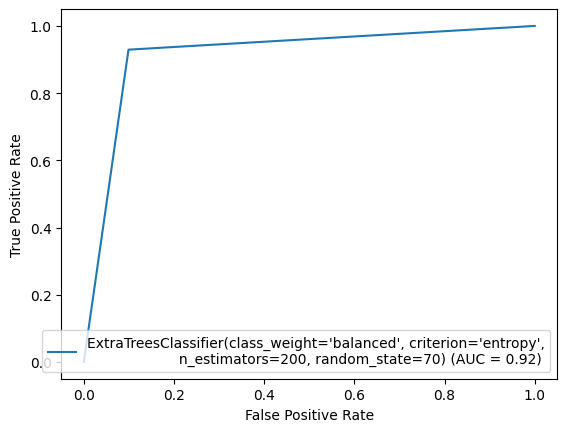

In [218]:
from sklearn import metrics
fpr,tpr,thresholds = metrics.roc_curve(y_test,pred)
roc_auc = metrics.auc(fpr,tpr)
display = metrics.RocCurveDisplay(fpr=fpr,tpr=tpr, roc_auc=roc_auc,estimator_name = Final_model)
display.plot()

- Applying class weights as "balanced," using entropy as the criterion, limiting max_features to 2, employing 200 estimators, fixing the random state to 70, and achieving an AUC of 0.92 implies a well-tuned random forest.
- This configuration balances sensitivity and specificity, with a high true positive rate and a controlled false positive rate, indicating effective discrimination between positive and negative instances.

In [219]:
import pickle
with open('Rainfall_Forecasting_RainTomorrow.pkl', 'wb') as file:
    pickle.dump(Final_model, file)

In [220]:
with open('Rainfall_Forecasting_RainTomorrow.pkl','rb') as file:
    model = pickle.load(file)
    result = model.score(x_test,y_test)
    print(result*100)

91.55427103403983


In [221]:
exc=np.array(y_test)
rainfall_Tomorrow_forecast = pd.DataFrame()
rainfall_Tomorrow_forecast['Predicted'] =pred
rainfall_Tomorrow_forecast['Actual'] = rfc
rainfall_Tomorrow_forecast

,Predicted,Actual
0,1,1
1,0,1
2,0,0
3,1,0
4,0,0
...,...,...
3109,1,0
3110,0,0
3111,0,0
3112,0,1
